<div class="alert alert-info" role="alert">
  <hr> <center> <font size="+3.5"> <b> Recherche d'une stratégie optimale pour réduire l'erreur de reconstruction: l'Error Adjusted VAE (EAVAE) </b> </font> </center> <hr>
</div>

<div class="alert alert-block" role="alert">
    <center><b> <u>Auteur :</u>  Lorenzo HERMEZ  </b></center>
</div>
<div class="alert alert-block" role="alert">
    <center> <font size="+1.5"> <b>  23 juillet 2022  </b>  </font> </center>
</div>

# Table de contenu

## 0. Préparation de l'environnement de travail
- chargement des modules
- mise en forme des données
- définition de quelques fonctions utiles

## 1. Premier modèle VAE pondéré sur les pas de temps les plus souvent extrema
- recherche des extrema
- construction du modèle
- entrainement
- évaluation de la représentation obtenue
- Construction de plusieurs modèles en fonction du poids de la pondération et entraînements successifs

## 2. Modèle EAVAE: pondération sur les erreurs commises par le premier modèle
- construction du modèle
- entrainement
- évaluation de la représentation obtenue et de la reconstruction des données.

<div class="alert alert-info" role="alert">
    <font size="+2"> <b> 0. Preparation de l'environnement de travail </b> </font> <hr>
</div>

# Chargement des modules et mise en forme des données

In [1]:
#import external libraries
import sys
import os
import datetime
import pandas as pd
import numpy as np
import pickle
from matplotlib import pyplot as plt
import seaborn as sn
from scipy import stats
import cv2 #from open-cv, to convert array to images
from IPython.display import Image
from tensorflow.keras.callbacks import TensorBoard
from time import time
from sklearn.decomposition import PCA

import warnings
warnings.filterwarnings('ignore')

2022-07-05 14:11:25.075685: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-07-05 14:11:25.075709: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


In [2]:
#root git folder 
name_model="vae_test"
path_second_folder = %pwd #"/home/goubetcle/Documents/Git/VAE/"
save_path = os.path.join(path_second_folder,"Results")#"/home/goubetcle/Documents/VAE/"
log_dir_model=os.path.join(save_path,"logs")
#path_main_folder = '/home/jovyan'#specify the root folder of the git repo

#add  to path root git folder 
sys.path.append(path_second_folder)

In [3]:
import importlib

sys.path.append(path_second_folder+'/src')

#import models, loss_class, params_class,AE_blocks,metrics
from src.models import *
#importlib.reload(models)
from src.loss_class import *
#importlib.reload(loss_class)
from src.params_class import *
#importlib.reload(params_class)
import src.AE_blocks
#importlib.reload(AE_blocks)
from src.metrics import *
#importlib.reload(metrics)
from src.utils import *

%load_ext autoreload
%autoreload 2


2022-07-05 14:11:28.340117: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory
2022-07-05 14:11:28.340157: W tensorflow/stream_executor/cuda/cuda_driver.cc:269] failed call to cuInit: UNKNOWN ERROR (303)
2022-07-05 14:11:28.340182: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (gm0winl472.bureau.si.interne): /proc/driver/nvidia/version does not exist
2022-07-05 14:11:28.340527: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Les données de consommation et de température sont des prises de mesure par pas de temps 30 minutes pendant 5 années de décembre 2012 à décembre 2020. 

In [4]:
# Load dataframe
dataset_csv = os.path.join('data', "dataset_2012_2020.csv")
df_data = pd.read_csv(dataset_csv, sep=";",)
df_data.utc_datetime = pd.to_datetime(df_data.utc_datetime, utc=True)

#Visualize data frame head
df_data.tail(5)

,utc_datetime,Consommation,prevision_j,prevision_j-1,prevision_neb,prevision_temp,is_holidays
157819,2020-12-31 21:30:00+00:00,64423.0,63700.0,64400.0,3.400764,2.328079,0.0
157820,2020-12-31 22:00:00+00:00,63505.0,63200.0,63800.0,3.479000,2.164250,0.0
157821,2020-12-31 22:30:00+00:00,64331.0,65200.0,65800.0,3.490986,2.029558,0.0
157822,2020-12-31 23:00:00+00:00,66853.0,67000.0,67500.0,3.369000,1.950550,0.0
157823,2020-12-31 23:30:00+00:00,66750.0,67200.0,67600.0,3.045322,1.953771,0.0


On s'intéresse ici à caractériser les profils journaliers. L'ensemble de données est donc transformé pour que notre jeu d'entrée soit ait en colonnes les points de mesure journaliers de la consommation d'électricité. Avant cela, tout ce qui va être inséré comme entrées du modèle est ici normalisé sur l'ensemble des mesures, puis mis en profils journaliers.

Notre jeu d'entrainement et pour référence est le jeu de données 2012-2018.

In [5]:
ds = pd.DataFrame({"days" : df_data.utc_datetime.dt.date, "minute":df_data.utc_datetime.dt.minute+60*df_data.utc_datetime.dt.hour})

df_conso, df_temp, df_prevision = make_chronics(df=pd.concat([df_data, ds], axis=1),
                                               toshape_columns=["Consommation", "prevision_temp", "prevision_j-1"],
                                               pivot_indexcol="days", pivot_columncol="minute")

df_conso.head()

minute,0,30,60,90,120,150,180,210,240,270,...,1140,1170,1200,1230,1260,1290,1320,1350,1380,1410
days,,,,,,,,,,,,,,,,,,,,,
2012-01-01,58315.0,58315.0,56231.0,56075.0,55532.0,54911.0,52496.0,50664.0,49161.0,47596.0,...,57333.0,57786.0,57752.0,56946.0,56054.0,54975.0,53890.0,54348.0,56577.0,55634.0
2012-01-02,55164.0,53643.0,51404.0,50842.0,50399.0,50113.0,48201.0,47182.0,46306.0,46294.0,...,73263.0,72615.0,71079.0,69050.0,67435.0,65332.0,63756.0,64030.0,65929.0,64902.0
2012-01-03,64600.0,63033.0,60533.0,60426.0,60104.0,59861.0,57915.0,56691.0,55743.0,55656.0,...,76698.0,75660.0,73535.0,71275.0,69189.0,66829.0,64861.0,64898.0,66939.0,65479.0
2012-01-04,65081.0,63129.0,60564.0,60194.0,59709.0,59353.0,57569.0,56545.0,55655.0,55628.0,...,78337.0,77173.0,75281.0,72985.0,70927.0,68726.0,66808.0,66878.0,68550.0,67376.0
2012-01-05,67042.0,65123.0,62447.0,62331.0,61889.0,61501.0,59574.0,58245.0,57258.0,56923.0,...,78351.0,76928.0,74868.0,72432.0,70197.0,68036.0,66269.0,66070.0,68169.0,66910.0


In [6]:
df_conso, conso_scaler = apply_scaler(df_data, column="Consommation", df_chronic=df_conso,
                                      reference_window=df_data.utc_datetime.dt.year <=2018)
df_conso.head()

minute,0,30,60,90,120,150,180,210,240,270,...,1140,1170,1200,1230,1260,1290,1320,1350,1380,1410
days,,,,,,,,,,,,,,,,,,,,,
2012-01-01,0.306926,0.306926,0.135886,0.123082,0.078516,0.027549,-0.170658,-0.321017,-0.444373,-0.572818,...,0.226330,0.263510,0.260719,0.194568,0.121359,0.032801,-0.056248,-0.018659,0.164283,0.086888
2012-01-02,0.048313,-0.076520,-0.260282,-0.306408,-0.342766,-0.366239,-0.523163,-0.606796,-0.678692,-0.679677,...,1.533758,1.480575,1.354510,1.187984,1.055435,0.882835,0.753487,0.775975,0.931833,0.847543
2012-01-03,0.822757,0.694148,0.488965,0.480183,0.453756,0.433812,0.274097,0.173639,0.095834,0.088693,...,1.815680,1.730488,1.556082,1.370597,1.199392,1.005699,0.844178,0.847215,1.014727,0.894900
2012-01-04,0.862234,0.702027,0.491509,0.461142,0.421337,0.392118,0.245700,0.161657,0.088611,0.086395,...,1.950198,1.854665,1.699382,1.510942,1.342035,1.161392,1.003975,1.009720,1.146947,1.050593
2012-01-05,1.023180,0.865682,0.646053,0.636533,0.600256,0.568412,0.410257,0.301181,0.220175,0.192680,...,1.951348,1.834557,1.665486,1.465555,1.282122,1.104761,0.959738,0.943405,1.115677,1.012347


'df_conso' est constitué des profils journaliers de consommation d'lélectricité que l'on va mettre en entrée de notre VAE

Pour interpréter notre représentation, on peut chercher à visualiser des paramètres connus associés à nos profils journaliers. Ici il s'agit notamment de données calendaires (mois, weekend, jour férié), auxquels on peut rajouter la température moyenne observée sur la journée (par exemple), ou encore la pente moyenne du profil.

Ces informations sont à passer dans calendar_info pour être visualisés dans une projection Tensorboard, et à passer en type et en valeur respectivement dans le dictionnaire factorDesc et factorMatrix pour servir dans l'évaluation des latents. 

In [7]:
#importation des données calendaires
df_calendar = make_df_calendar(pd.DataFrame({"ds" : pd.to_datetime(np.asarray(df_conso.index))}))

df_holidays = pd.concat([df_data[["is_holidays"]],pd.DataFrame({"ds" : pd.to_datetime(ds.days.values)})], axis=1).drop_duplicates(
                                               subset="ds").reset_index(drop= True)

df_calendar = df_calendar.merge(df_holidays, on="ds", how="left").rename(columns={"is_holidays":"is_holiday_day"})

df_calendar.head(5)

,ds,month,weekday,is_weekend,year,is_holiday_day
0,2012-01-01,1,6,1,2012,1.0
1,2012-01-02,1,0,0,2012,0.0
2,2012-01-03,1,1,0,2012,0.0
3,2012-01-04,1,2,0,2012,0.0
4,2012-01-05,1,3,0,2012,0.0


In [8]:
#explicit the potential bridge days taken as extended holidays
day_hol = df_calendar[['weekday', 'is_holiday_day']].copy().values
bridge_index=[]
for i in range(day_hol.shape[0]):
    if day_hol[i,1]==1:
        if day_hol[i,0]==1:
            bridge_index.append(i-1)
        elif day_hol[i,0]==3:
            bridge_index.append(i+1)

bridges = np.zeros(day_hol.shape[0])
bridges[np.asarray(bridge_index)] = 1

df_calendar['potential_bridge_holiday'] = bridges
#calendar_info['potential_bridge_holiday'].describe()

In [9]:
calendar_factors = ["weekday", "is_weekend", "month", "is_holiday_day"]
factors = df_calendar[calendar_factors].copy()
factorDesc = {ff : 'category' for ff in calendar_factors}

temperatureMean= df_temp.mean(axis=1).values.reshape(-1,1)
factorMatrix = np.c_[factors.values,temperatureMean]
factorDesc['temperature']='regressor'


# Tools to evaluate the representations

In [10]:
from math import cos, sin
#visualisation d'une représentation 2D dans le notebook
def prez_2D(x_encoded, factorMatrix, temperatureMean):
    proj2D = PCA(2)
    proj = proj2D.fit_transform(x_encoded)
    plt.figure(figsize=(36,18))
    
    #visualisation des mois par un disque de fond coloré
    for i in np.unique(factorMatrix[:,0]):
        i = int(i)
        index = factorMatrix[:,0]==i
        plt.scatter(x=proj[index,0], y=proj[index,1], c= factorMatrix[index,2], marker = 'o', s=500, alpha=0.5, cmap = 'Paired')

    plt.colorbar().set_label('month');
    
    #visualisation de la température par la coloration graduelle du jour de la semaine
    for i in np.unique(factorMatrix[:,0]):
        i = int(i)
        index = factorMatrix[:,0]==i
        plt.scatter(x=proj[index,0], y=proj[index,1], c= temperatureMean[index].ravel(), marker = '$'+str(i)+'$', s=200)

    plt.colorbar().set_label('temperature');
    
def prez_3D(x_encoded, factorMatrix, temperatureMean):
    proj3D = PCA(3)
    proj_z = proj3D.fit_transform(x_encoded)
    plt.figure(figsize=(36,18))
    
    proj = proj_z[:,:2]
    third = proj_z[:,2]
    
    proj = proj + np.tile(third.reshape(-1,1), (1,2)) * np.tile(np.array([[-cos(0.785),sin(0.785)]]),(nPoints,1))
    
    size = 300  + (1.- np.exp(-third / max(third))) * 800
    #visualisation des mois par un disque de fond coloré
    for i in np.unique(factorMatrix[:,1]):
        i = int(i)
        index = factorMatrix[:,0]==i
        plt.scatter(x=proj[index,0], y=proj[index,1], c= factorMatrix[index,2], marker = 'o', s=size, alpha=0.5, cmap = 'Paired')

    plt.colorbar().set_label('month');
    
    #visualisation de la température par la coloration graduelle du jour de la semaine
    for i in np.unique(factorMatrix[:,1]):
        i = int(i)
        index = factorMatrix[:,0]==i
        plt.scatter(x=proj[index,0], y=proj[index,1], c= temperatureMean[index], marker = '$'+str(i)+'$', s=200)

    plt.colorbar().set_label('temperature');

Pour créer une représentation sous tensorboard, la fonction suivante regroupe toutes les étapes. Le booléen includeConsuptionProfileImages active ou non le marqueur des points à l'image des profils de consommation.

In [11]:
def tensorboardProjection(name_model,x, x_hat, x_encoded, x_conso, calendar_info, log_dir_projector, includeConsumptionProfileImages=True):
    #can take a bit longer to create and load in tensorboard projector, but it looks better in the projector
    if includeConsumptionProfileImages:
        nPoints=1500 #if you want to visualize images of consumption profiles and its recontruction in tensorboard, there is a maximum size that can be handle for a sprite image. 1830 is  
        x_encoded_reduced=x_encoded[0:nPoints,]
        images=createLoadProfileImages(x,x_hat,nPoints)
    else:
        nPoints=df_conso.shape[0]
        
    if includeConsumptionProfileImages:
        sprites=images_to_sprite(images)
        cv2.imwrite(os.path.join(log_dir_projector, 'sprite_4_classes.png'), sprites)
    
    writeMetaData(log_dir_projector,x_conso,calendar_info,nPoints,has_Odd=False)
    if includeConsumptionProfileImages:
        buildProjector(x_encoded_reduced,images=images, log_dir=log_dir_projector)
    else:
        buildProjector(x_encoded,images=None, log_dir=log_dir_projector)
        
    print(log_dir_projector)

In [12]:
#Visualisation des courbes de charge en entrée et reconstruite par le modèle

def display_loads(x, x_hat,date,mae):
    fig = plt.figure(dpi=100,figsize=(5,5))
    #set(gca,'Color','k')
    plt.plot(scaler_conso.inverse_transform(x), label = 'truth')
    plt.plot(scaler_conso.inverse_transform(x_hat), '--', label = 'reconstruction')
    plt.title(date+' - mean absolute error %0.2f GW' %(mae*std_sc/1000))
    plt.xlabel('hours')
    plt.ylabel('load (MW)')
    plt.xlim((0,48))
    plt.xticks([5,11,17,23,29,35,41], [3,6,9,12,15,18,21])
    plt.legend(loc='lower right')
    plt.grid();

<div class="alert alert-info" role="alert">
    <font size="+2"> <b> 1. Un modèle classique </b> </font> <hr>
</div>

## Rappels

Les autoencodeurs variationnels sont des modèles qui fonctionnent en duo:
- un encodeur qui traduit les données d'entrée dans un espace latent de dimension arbitrairement choisie. Plus exactement il cherche les paramètres de distribution des variables latentes dans chacune des dimensions.
- un decodeur qui cherche à reconstruire les entrées à partir des coordonnées dans l'espace latent

Pendant l'appentissage, le lien entre encodeur et decodeur est réalisé par l'échantillage selon les paramètres de distribution appris : chaque échantillon a des coordonnées latentes tirées aléatoirement selon cette dernière, que le décodeur cherche à retraduire dans l'espace de dimension initial. 

## Construire et entrainer un modèle VAE ou CVAE

Il s'agit dans un premier temps de paramétrer les dimensions des couches de nos réseaux de neurone:
- celles de l'encodeur e_dim
- celles du décodeur d_dims
- les dimensions de notre espace latent z_dim (chaque paramètre de distribution sera donc aussi de dimension z_dim)
- les dimensions de notre embedding des conditions dans le cas dans CVAE

In [13]:
# paramètres de l'autoencodeur
z_dim = 4 # le nombre de dimensions voulues dans notre représentation latente
e_dims=[48,48,24,12]# les couches cachées du bloc encodeur; premier nombre = inputs_dim
d_dims=[12,24,48,48]# les couches cachées du bloc decodeur; premier nombre = outputs_dim
lr=3e-4 # le learning rate de l'optimiseur
input_dim = df_conso.shape[1]

Pour les paramètres liés au modèle, il faut rappeler le fonctionnement du VAE. On cherche la maximisation de la borne inférieure de la log-vraissemblance du modèle reconstruit ou ELBO qui se décompose en deux termes :

ELBO $= \mathbb{E}_{q_\phi(z|x)} \log(p_\theta(x|z)) - KL(q_\phi(z|x) \| p(z))$

Dans notre objectif d'apprentissage, cela est traduit par une perte à minimiser de la forme:

Obj $= \|x - \hat{x}\| +  KL(q_\phi(z|x) \| p(z))$.

- L'erreur de reconstruction peut être choisie selon une mesure en norme L1 ou L2. La norme L1 permet notamment d'obtenir des profils avec moins de valeurs abérrantes.

- Un prior $p(z)$ laplacien plutôt que gaussien permet des concentrations plus piquées des groupements similaires, et renvoie plus loin les points atypiques. 


- Par ailleurs, pour faciliter l'apprentissage du modèle de façon structurée dans les dimensions choisies de l'espace latent, l'action peut se porter sur le choix du prior comme sur des critères de régularisation devant le terme de divergence.

    Ces termes de régularisation s'appliquent de la façon suivante :

    Obj $= \|x - \hat{x}\| +  \beta KL(q_\phi(z|x) \| p(z)) + \gamma MMD(q_\phi(z) \| p(z))$ si modèle InfoVAE
    avec $\beta \in \left[0,1\right] $ et $\gamma \ge 0$ (si possible grand)

In [14]:
# paramètres de l'entrainement du modèle
epochs = 800
batch_size = 16

On va mettre en forme ici les facteurs sur lesquels on va rendre la représentation latente agnostique. Attention à normaliser les variables quantitatives et à one-hot encoder les variables catégorielles. 

In [15]:
#on va conditionner sur les profils de température et le mois
calendar_cond = []
condtovae_dims = []
condarray=[]

df_temp, _ = apply_scaler(df_data, column="prevision_temp", df_chronic=df_temp,
                                      reference_window=None)

condarray.append(df_temp.values)
condtovae_dims.append(condarray[-1].shape[1])

for cc in calendar_cond:
    condarray.append(pd.get_dummies(df_calendar[cc], prefix=cc).values)
    condtovae_dims.append(condarray[-1].shape[1])



In [16]:
vae_params = VAE_params(name=name_model, out_dir = log_dir_model)

In [17]:
vae_params.set_model_params()
vae_params.set_training_params()

Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  False
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003


In [18]:
vae_params.model_params.encoder_dims = e_dims
vae_params.model_params.decoder_dims = d_dims
vae_params.model_params.cond_dims = []
vae_params.model_params.with_embedding = False
vae_params.model_params.with_Time2Vec = False
vae_params.model_params.emb_dims = []
vae_params.model_params.nb_encoder_ensemble = 1

In [19]:
train_set = df_calendar.year.values <= 2018
test_set = df_calendar.year.values == 2019

input_cvae = [df_conso.values[train_set,:]]
output_cvae = df_conso.values[train_set,:]

Recherche des pas de temps extrema pour pondérer cette erreur de reconstruction


(0.0, 48.0)

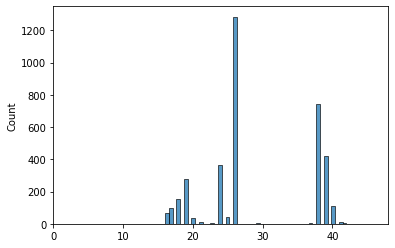

In [20]:
from scipy.signal import argrelextrema, argrelmax

max = argrelextrema(df_conso.values[:,8:44], np.greater, order=18, axis=1)
unique_max, count_max = np.unique(max[1],return_counts=True)
sn.histplot(max[1]+8,bins=48)
plt.xlim((0,48))

(0.0, 48.0)

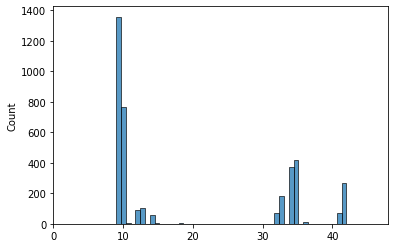

In [21]:
from scipy.signal import argrelextrema, argrelmax

min = argrelextrema(df_conso.values[:,8:44], np.less, order=18, axis=1)
unique_min, count_min = np.unique(min[1],return_counts=True)
sn.histplot(min[1]+8,bins=48)
plt.xlim((0,48))

In [22]:
unique_extrema, counts_extrema = np.unique(np.concatenate([max[1], min[1]]),return_counts=True)

In [25]:
sample_weight = np.zeros((48,))
sample_weight[unique_extrema+8] = counts_extrema
ponderation = sample_weight/sample_weight.max()*4 +1

In [27]:
#example of custom loss definition
ponderation = sample_weight/sample_weight.max()*4 +1
def loss_1(y_true, y_pred, ponderation=ponderation):
    return tf.math.reduce_sum(tf.math.square(y_true - y_pred) * ponderation, axis=-1)


custom_loss={"pond_loss" : {"function" : loss_1,
            "args" :{} }}

loss_weights = {"kl_loss" : 0.3,
                "info_loss" : 66,
               "pond_loss":1}

vae_loss = VAELoss(loss_weights = loss_weights, custom_loss=custom_loss)
vae_loss.options["log_prior_sigma"] = [-2.,-1.,0.,1]

vae_params.training_params.loss = vae_loss
vae_params.training_params.lr = 1e-5


In [28]:
from src.models import CVAEpond
new_cae=CVAEpond(vae_params)
new_cae.VAE_params.__dict__

{'name': 'vae_test',
 'folder': '/home/hermezlor/Documents/cvae-env/VAE/Results/logs/vae_test',
 'model_params': <src.params_class.VAEModelParams at 0x7fa8a4201d30>,
 'training_params': <src.params_class.VAETrainingParams at 0x7fa8a4201f70>}

In [29]:
new_cae.build_model(vae_params)

Model: "cvae"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 x_inputs (InputLayer)          [(None, 48)]         0           []                               
                                                                                                  
 encoder (Functional)           [(None, 4),          6284        ['x_inputs[0][0]']               
                                 (None, 4)]                                                       
                                                                                                  
 reparametrizing_layer (Lambda)  (None, 4)           0           ['encoder[0][0]',                
                                                                  'encoder[0][1]']                
                                                                                               

In [30]:
from tensorflow.keras.callbacks import EarlyStopping
earl_stop = EarlyStopping(
    monitor='val_loss', min_delta=0, patience=100, verbose=0, mode='auto',
    baseline=None, restore_best_weights=True
)


## START TRAINING ##
Epoch 1/2000
144/144 [==============================] - 4s 7ms/step - loss: 196.4493 - pond_loss: 139.5316 - kl_loss: 5.2651 - info_loss: 23.1903 - val_loss: 175.9876 - val_pond_loss: 105.5855 - val_kl_loss: 3.6760 - val_info_loss: 31.5250
Epoch 2/2000
144/144 [==============================] - 1s 4ms/step - loss: 176.3081 - pond_loss: 124.7155 - kl_loss: 4.6395 - info_loss: 21.1575 - val_loss: 163.3705 - val_pond_loss: 97.3820 - val_kl_loss: 3.3407 - val_info_loss: 29.6536
Epoch 3/2000
144/144 [==============================] - 1s 4ms/step - loss: 158.1004 - pond_loss: 110.5216 - kl_loss: 4.3050 - info_loss: 19.4816 - val_loss: 153.5430 - val_pond_loss: 87.1578 - val_kl_loss: 3.2577 - val_info_loss: 29.9349
Epoch 4/2000
144/144 [==============================] - 1s 5ms/step - loss: 146.5243 - pond_loss: 101.3125 - kl_loss: 4.1334 - info_loss: 18.4710 - val_loss: 142.9718 - val_pond_loss: 80.3696 - val_kl_loss: 3.2645 - val_info_loss: 28.0366
Epoch 5/2000
144/144 [

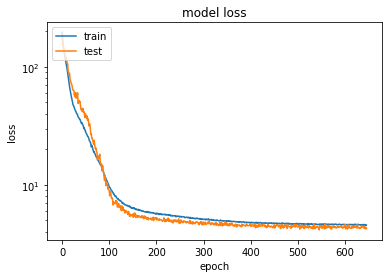

## MODEL SAVED ##


In [31]:
new_cae.train(input_cvae, output_cvae, epochs= 2000, verbose=1,
              batch_size=batch_size, callbacks=[earl_stop])

In [34]:
dict_loss = new_cae.training_history.history

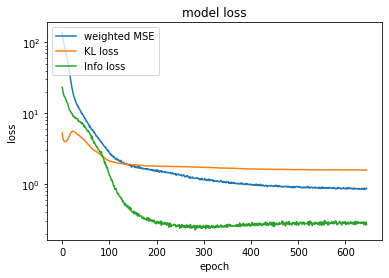

In [41]:
plt.plot(dict_loss['pond_loss'])
plt.plot(dict_loss['kl_loss'])
plt.plot(dict_loss['info_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.yscale('log')
plt.legend(['weighted MSE', 'KL loss', 'Info loss'], loc='upper left')
plt.show()

## Evaluer l'importance et la qualité des embeggings appris

Nous allons voir:
- l'importance portée par des variables dans la représentation latente
- l'importance portée par des variables dans l'embedding conditionnel

Nous nous appuyons pour cela sur des score d'information, de démêlement, de compacité et de modularité

Nous devrions constater que des variables importante dans l'embedding conditionnel ne le sont plus dans la représentation latente: elles ont été factorisées

In [35]:
x_encoded = new_cae.encoder.predict(input_cvae)[0]

In [36]:
model_eval, importanceMatrix =evaluate_latent_code(x_encoded, factorMatrix[train_set,:], factorDesc, orthogonalize=True, normalize_information=True)
#normalize_information normalise le score avec le minimum obtenu avec une projection aléatoire

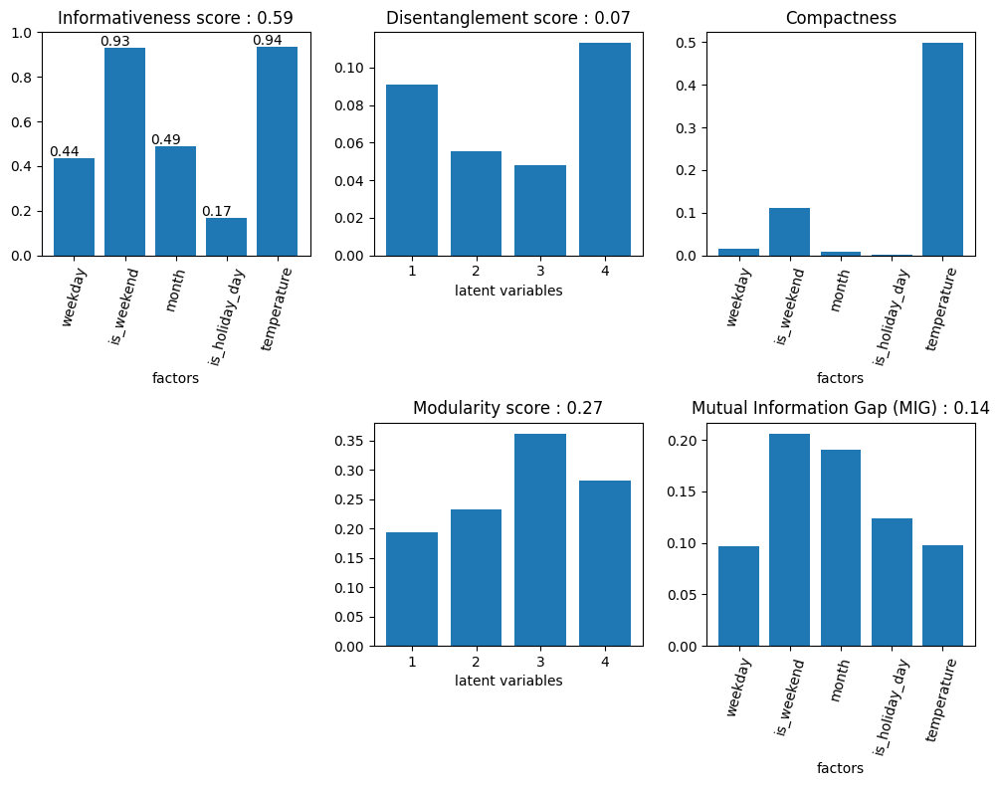

In [37]:
display_evaluation_latent_code(model_eval, z_dim, factorDesc)

In [38]:
test_input_cvae = [df_conso.values[test_set,:]]
x_hat = new_cae.model.predict(test_input_cvae)

print(f"reconstruction error to scale : {np.mean(np.abs(conso_scaler.inverse_transform(x_hat).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019]))}")

reconstruction error to scale : 1109.470098904823


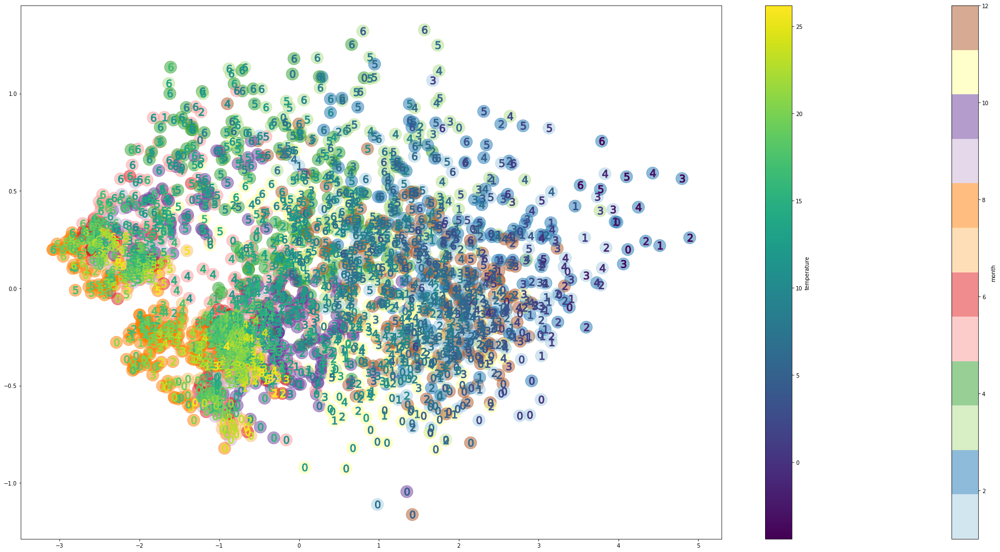

In [39]:
prez_2D(x_encoded, factorMatrix[train_set,:], temperatureMean[train_set])

Modèle CVAE classique: 

In [37]:
vae_params2 = VAE_params(name=name_model, out_dir = log_dir_model)
vae_params2.set_model_params()
vae_params2.set_training_params()
vae_params2.model_params.decoder_dims = d_dims
vae_params2.model_params.cond_dims = []
vae_params2.model_params.with_embedding = False
vae_params2.model_params.with_Time2Vec = False
vae_params2.model_params.emb_dims = []
vae_params2.model_params.nb_encoder_ensemble = 1

Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  False
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003


In [38]:
loss_weights2 = {"recon_loss":1,
                "kl_loss" : 0.3,
                "info_loss" : 66
               }

vae_loss = VAELoss(loss_weights = loss_weights2, custom_loss=None)
vae_loss.options["log_prior_sigma"] = [-2.,-1.,0.,1]

vae_params2.training_params.loss = vae_loss
vae_params2.training_params.lr = 1e-5


In [39]:
cvae = CVAE(vae_params2)
cvae.build_model(vae_params2)

Model: "cvae"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 x_inputs (InputLayer)          [(None, 48)]         0           []                               
                                                                                                  
 encoder (Functional)           [(None, 4),          916         ['x_inputs[0][0]']               
                                 (None, 4)]                                                       
                                                                                                  
 reparametrizing_layer (Lambda)  (None, 4)           0           ['encoder[0][0]',                
                                                                  'encoder[0][1]']                
                                                                                               

In [41]:
from tensorflow.keras.callbacks import EarlyStopping
earl_stop = EarlyStopping(
    monitor='val_loss', min_delta=0, patience=100, verbose=0, mode='auto',
    baseline=None, restore_best_weights=True
)

## START TRAINING ##
Epoch 1/2000
144/144 [==============================] - 2s 6ms/step - loss: 49.9046 - val_loss: 48.2654
Epoch 2/2000
144/144 [==============================] - 0s 3ms/step - loss: 47.5035 - val_loss: 44.8944
Epoch 3/2000
144/144 [==============================] - 0s 3ms/step - loss: 46.6153 - val_loss: 40.2930
Epoch 4/2000
144/144 [==============================] - 0s 2ms/step - loss: 45.3648 - val_loss: 40.8263
Epoch 5/2000
144/144 [==============================] - 0s 3ms/step - loss: 43.9514 - val_loss: 42.3329
Epoch 6/2000
144/144 [==============================] - 0s 3ms/step - loss: 42.7648 - val_loss: 41.3735
Epoch 7/2000
144/144 [==============================] - 0s 2ms/step - loss: 41.7577 - val_loss: 41.5226
Epoch 8/2000
144/144 [==============================] - 0s 2ms/step - loss: 41.7636 - val_loss: 38.6121
Epoch 9/2000
144/144 [==============================] - 0s 2ms/step - loss: 42.0313 - val_loss: 38.6574
Epoch 10/2000
144/144 [====================

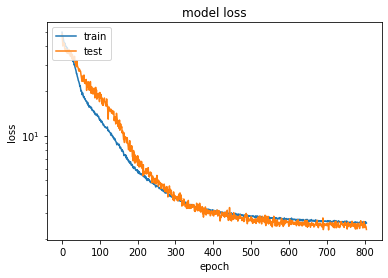

## MODEL SAVED ##


In [42]:
cvae.train(input_cvae, output_cvae, epochs= 2000, verbose=1,
              batch_size=batch_size, callbacks=[earl_stop])

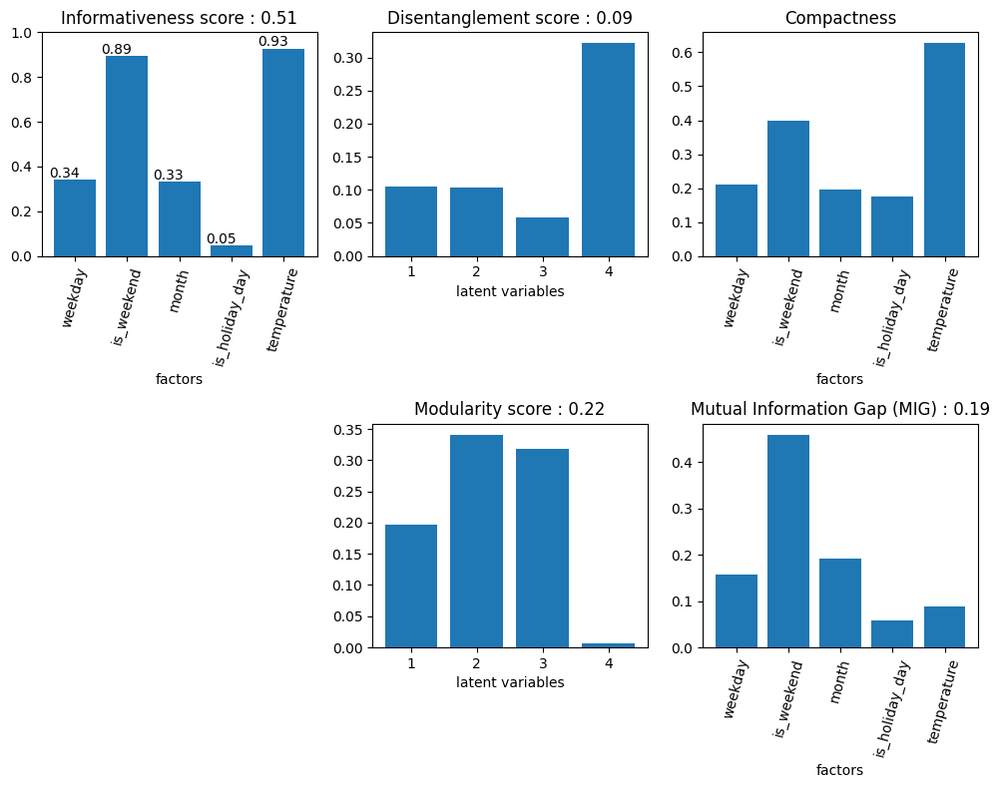

In [43]:
x_encoded2 = cvae.encoder.predict(input_cvae)[0]
model_eval2, importanceMatrix2 =evaluate_latent_code(x_encoded2, factorMatrix[train_set,:], factorDesc, orthogonalize=True, normalize_information=True)
#normalize_information normalise le score avec le minimum obtenu avec une projection aléatoire
display_evaluation_latent_code(model_eval2, z_dim, factorDesc)

In [44]:
test_input_cvae = [df_conso.values[test_set,:]]
x_hat2 = cvae.model.predict(test_input_cvae)

print(f"reconstruction error to scale : {np.mean(np.abs(conso_scaler.inverse_transform(x_hat2).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019]))}")

reconstruction error to scale : 1673.4466327545306


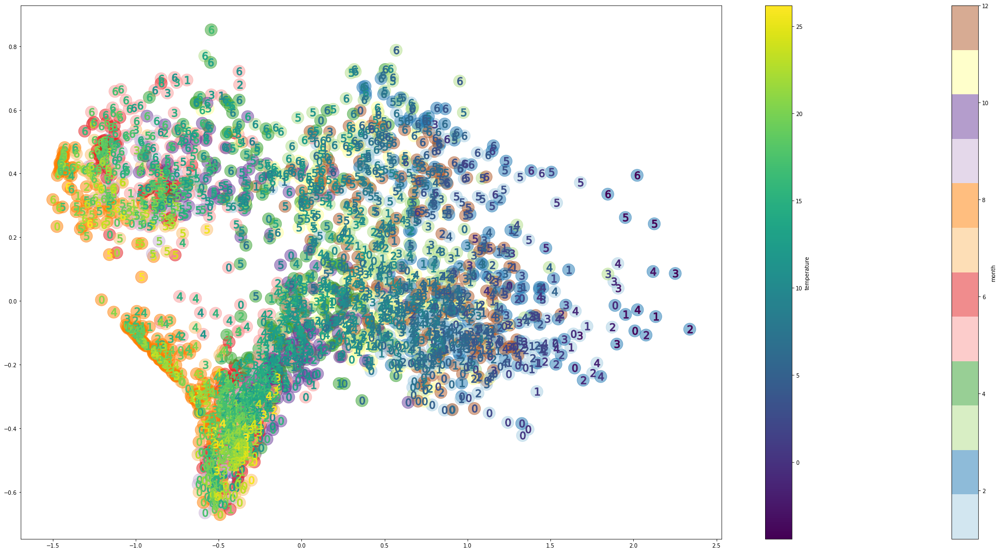

In [45]:
prez_2D(x_encoded2, factorMatrix[train_set,:], temperatureMean[train_set,:])

MSE coefficient diff de 1

In [46]:
vae_params3 = VAE_params(name=name_model, out_dir = log_dir_model)
vae_params3.set_model_params()
vae_params3.set_training_params()
vae_params3.model_params.decoder_dims = d_dims
vae_params3.model_params.cond_dims = []
vae_params3.model_params.with_embedding = False
vae_params3.model_params.with_Time2Vec = False
vae_params3.model_params.emb_dims = []
vae_params3.model_params.nb_encoder_ensemble = 1

Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  False
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003


In [47]:
loss_weights3 = {"recon_loss":ponderation.mean(),
                "kl_loss" : 0.3,
                "info_loss" : 66
               }

vae_loss = VAELoss(loss_weights = loss_weights3, custom_loss=None)
vae_loss.options["log_prior_sigma"] = [-2.,-1.,0.,1]

vae_params3.training_params.loss = vae_loss
vae_params3.training_params.lr = 1e-5

Model: "cvae"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 x_inputs (InputLayer)          [(None, 48)]         0           []                               
                                                                                                  
 encoder (Functional)           [(None, 4),          916         ['x_inputs[0][0]']               
                                 (None, 4)]                                                       
                                                                                                  
 reparametrizing_layer (Lambda)  (None, 4)           0           ['encoder[0][0]',                
                                                                  'encoder[0][1]']                
                                                                                               

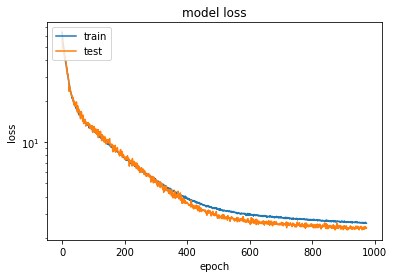

## MODEL SAVED ##


In [48]:
cvae3 = CVAE(vae_params3)
cvae3.build_model(vae_params3)
from tensorflow.keras.callbacks import EarlyStopping
earl_stop = EarlyStopping(
    monitor='val_loss', min_delta=0, patience=100, verbose=0, mode='auto',
    baseline=None, restore_best_weights=True
)
cvae3.train(input_cvae, output_cvae, epochs= 2000, verbose=1,
              batch_size=batch_size, callbacks=[earl_stop])

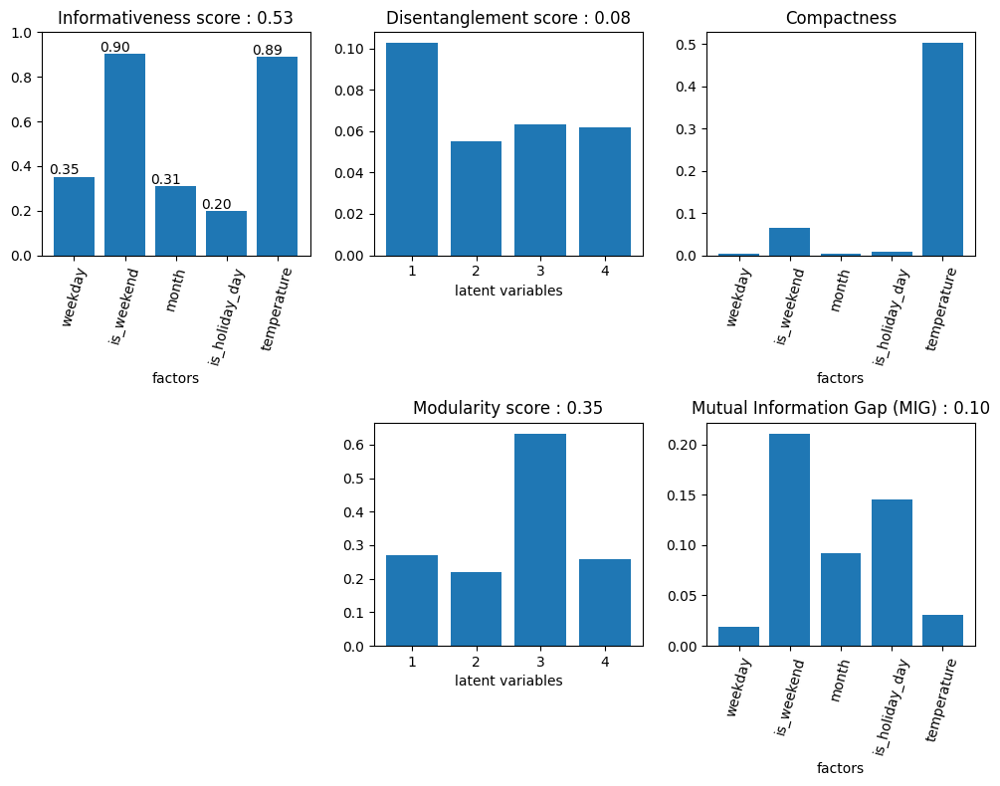

In [49]:
x_encoded3 = cvae3.encoder.predict(input_cvae)[0]
model_eval3, importanceMatrix2 =evaluate_latent_code(x_encoded3, factorMatrix[train_set,:], factorDesc, orthogonalize=True, normalize_information=True)
#normalize_information normalise le score avec le minimum obtenu avec une projection aléatoire
display_evaluation_latent_code(model_eval3, z_dim, factorDesc)

In [50]:
test_input_cvae = [df_conso.values[test_set,:]]
x_hat3 = cvae3.model.predict(test_input_cvae)

print(f"reconstruction error to scale : {np.mean(np.abs(conso_scaler.inverse_transform(x_hat3).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019]))}")

reconstruction error to scale : 1641.1888415471603


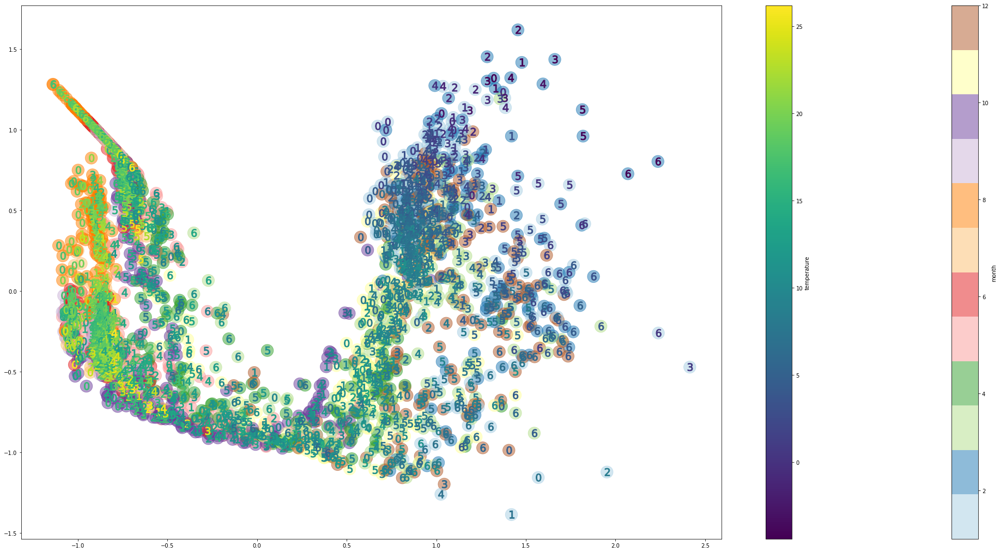

In [51]:
prez_2D(x_encoded3, factorMatrix[train_set,:], temperatureMean[train_set,:])

## Influence de la pondération sur l'erreur de reconstruction

Model: "cvae"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 x_inputs (InputLayer)          [(None, 48)]         0           []                               
                                                                                                  
 encoder (Functional)           [(None, 4),          6284        ['x_inputs[0][0]']               
                                 (None, 4)]                                                       
                                                                                                  
 reparametrizing_layer (Lambda)  (None, 4)           0           ['encoder[0][0]',                
                                                                  'encoder[0][1]']                
                                                                                               

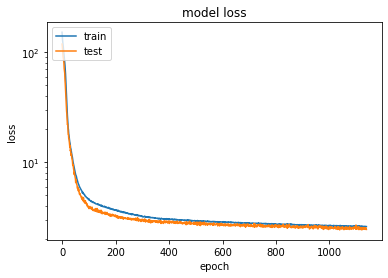

## MODEL SAVED ##


In [63]:
from src.models import CVAEpond

ponderation1 = sample_weight/sample_weight.max()*4 +1
def loss_1(y_true, y_pred, ponderation=ponderation1):
    return tf.math.reduce_sum(tf.math.square(y_true - y_pred) * ponderation, axis=-1)


custom_loss={"pond_loss" : {"function" : loss_1,
            "args" :{} }}

loss_weights = {"kl_loss" : 0.3,
                "info_loss" : 66,
               "pond_loss":1}

vae_loss = VAELoss(loss_weights = loss_weights, custom_loss=custom_loss)
vae_loss.options["log_prior_sigma"] = [-2.,-1.,0.,1]

vae_params.training_params.loss = vae_loss
vae_params.training_params.lr = 1e-5

new_cae1=CVAEpond(vae_params)
new_cae1.VAE_params.__dict__
new_cae1.build_model(vae_params)
from tensorflow.keras.callbacks import EarlyStopping
earl_stop = EarlyStopping(
    monitor='val_loss', min_delta=0, patience=100, verbose=0, mode='auto',
    baseline=None, restore_best_weights=True
)

new_cae1.train(input_cvae, output_cvae, epochs= 2000, verbose=1,
              batch_size=batch_size, callbacks=[earl_stop])

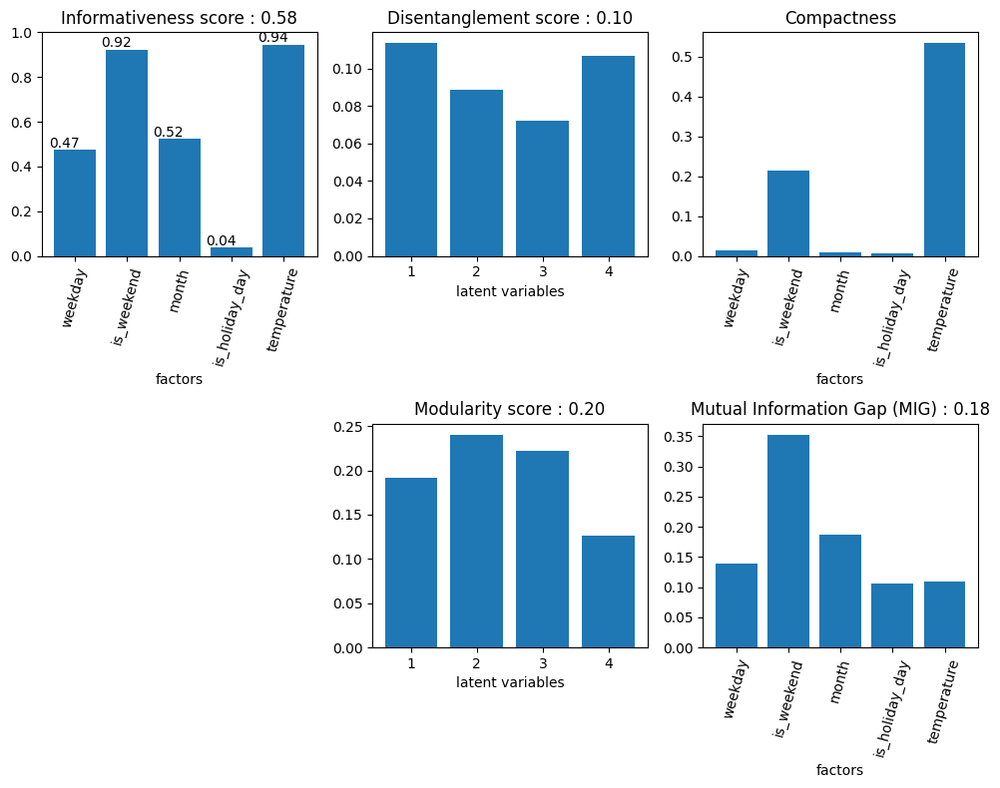

In [64]:
x_encoded_pond1 = new_cae1.encoder.predict(input_cvae)[0]
model_eval_pond1, _ =evaluate_latent_code(x_encoded_pond1, factorMatrix[train_set,:], factorDesc, orthogonalize=True, normalize_information=True)
#normalize_information normalise le score avec le minimum obtenu avec une projection aléatoire
display_evaluation_latent_code(model_eval_pond1, z_dim, factorDesc)

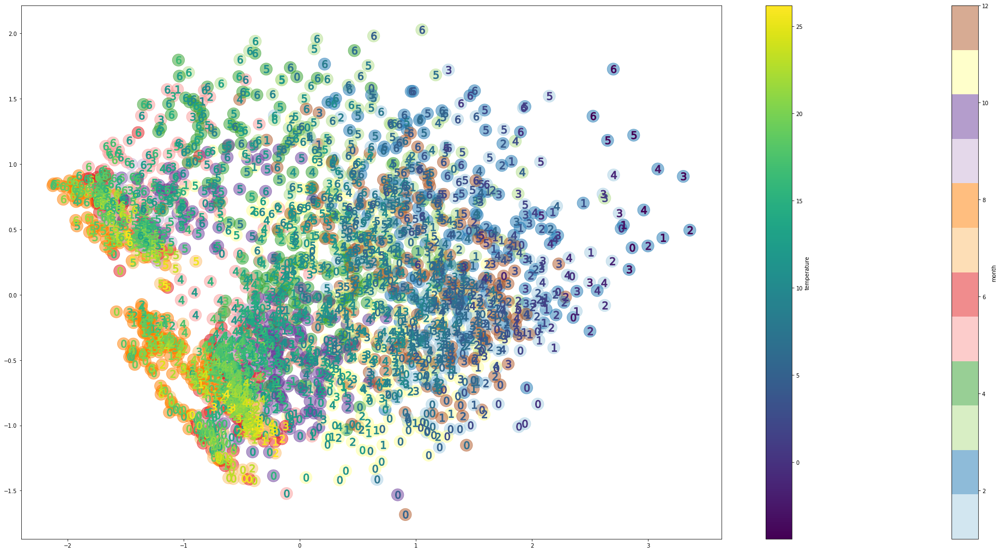

In [65]:
prez_2D(x_encoded_pond1, factorMatrix[train_set,:], temperatureMean[train_set,:])

Model: "cvae"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 x_inputs (InputLayer)          [(None, 48)]         0           []                               
                                                                                                  
 encoder (Functional)           [(None, 4),          6284        ['x_inputs[0][0]']               
                                 (None, 4)]                                                       
                                                                                                  
 reparametrizing_layer (Lambda)  (None, 4)           0           ['encoder[0][0]',                
                                                                  'encoder[0][1]']                
                                                                                               

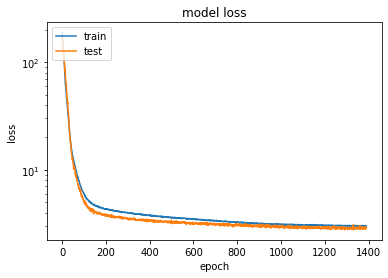

## MODEL SAVED ##


In [66]:
from src.models import CVAEpond

ponderation2 = sample_weight/sample_weight.max()*9 +1
def loss_1(y_true, y_pred, ponderation=ponderation2):
    return tf.math.reduce_sum(tf.math.square(y_true - y_pred) * ponderation, axis=-1)


custom_loss={"pond_loss" : {"function" : loss_1,
            "args" :{} }}

loss_weights = {"kl_loss" : 0.3,
                "info_loss" : 66,
               "pond_loss":1}

vae_loss = VAELoss(loss_weights = loss_weights, custom_loss=custom_loss)
vae_loss.options["log_prior_sigma"] = [-2.,-1.,0.,1]

vae_params.training_params.loss = vae_loss
vae_params.training_params.lr = 1e-5

new_cae2=CVAEpond(vae_params)
new_cae2.VAE_params.__dict__
new_cae2.build_model(vae_params)
from tensorflow.keras.callbacks import EarlyStopping
earl_stop = EarlyStopping(
    monitor='val_loss', min_delta=0, patience=100, verbose=0, mode='auto',
    baseline=None, restore_best_weights=True
)

new_cae2.train(input_cvae, output_cvae, epochs= 2000, verbose=1,
              batch_size=batch_size, callbacks=[earl_stop])

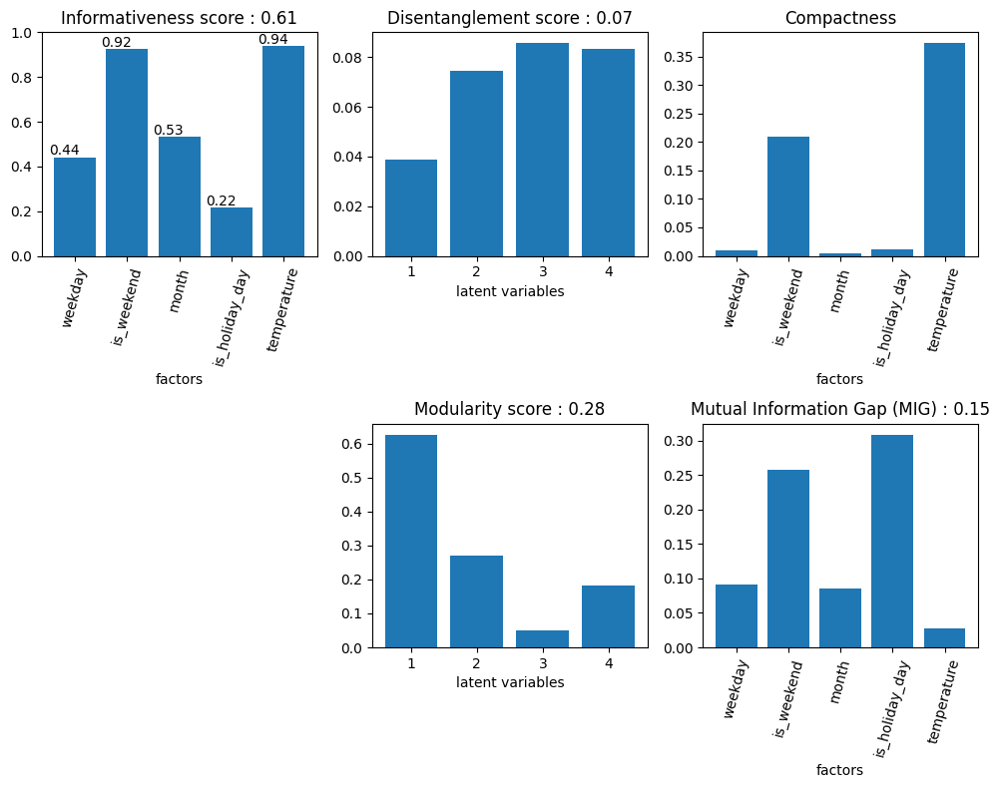

In [67]:
x_encoded_pond2 = new_cae2.encoder.predict(input_cvae)[0]
model_eval_pond2, _ =evaluate_latent_code(x_encoded_pond2, factorMatrix[train_set,:], factorDesc, orthogonalize=True, normalize_information=True)
#normalize_information normalise le score avec le minimum obtenu avec une projection aléatoire
display_evaluation_latent_code(model_eval_pond2, z_dim, factorDesc)

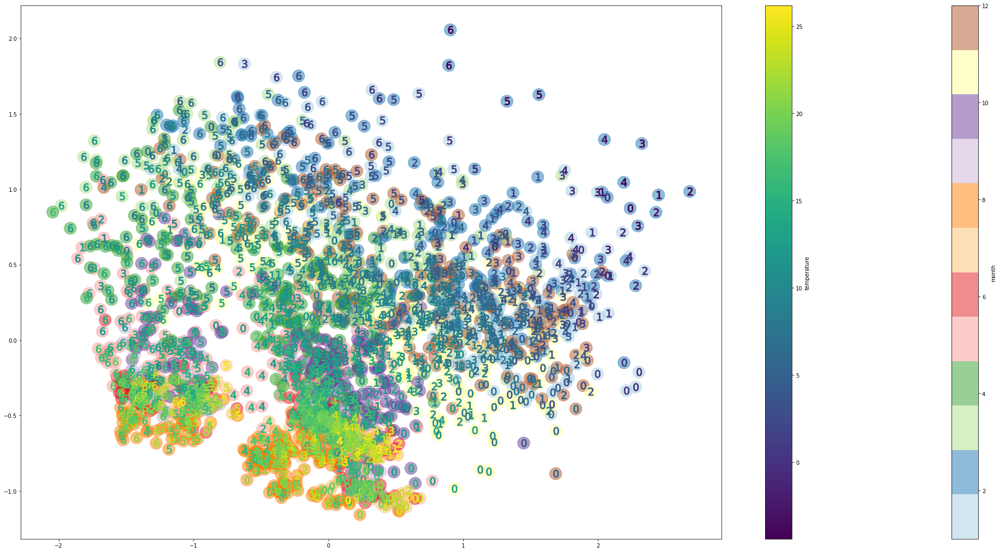

In [68]:
prez_2D(x_encoded_pond2, factorMatrix[train_set,:], temperatureMean[train_set,:])

Model: "cvae"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 x_inputs (InputLayer)          [(None, 48)]         0           []                               
                                                                                                  
 encoder (Functional)           [(None, 4),          6284        ['x_inputs[0][0]']               
                                 (None, 4)]                                                       
                                                                                                  
 reparametrizing_layer (Lambda)  (None, 4)           0           ['encoder[0][0]',                
                                                                  'encoder[0][1]']                
                                                                                               

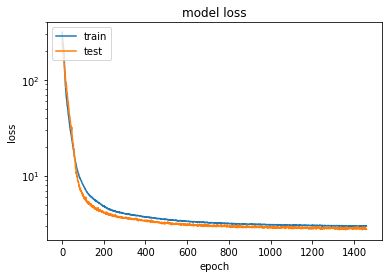

## MODEL SAVED ##


In [69]:
from src.models import CVAEpond

ponderation3 = sample_weight/sample_weight.max()*24 +1
def loss_1(y_true, y_pred, ponderation=ponderation3):
    return tf.math.reduce_sum(tf.math.square(y_true - y_pred) * ponderation, axis=-1)


custom_loss={"pond_loss" : {"function" : loss_1,
            "args" :{} }}

loss_weights = {"kl_loss" : 0.3,
                "info_loss" : 66,
               "pond_loss":1}

vae_loss = VAELoss(loss_weights = loss_weights, custom_loss=custom_loss)
vae_loss.options["log_prior_sigma"] = [-2.,-1.,0.,1]

vae_params.training_params.loss = vae_loss
vae_params.training_params.lr = 1e-5

new_cae3=CVAEpond(vae_params)
new_cae3.VAE_params.__dict__
new_cae3.build_model(vae_params)
from tensorflow.keras.callbacks import EarlyStopping
earl_stop = EarlyStopping(
    monitor='val_loss', min_delta=0, patience=100, verbose=0, mode='auto',
    baseline=None, restore_best_weights=True
)

new_cae3.train(input_cvae, output_cvae, epochs= 2000, verbose=1,
              batch_size=batch_size, callbacks=[earl_stop])

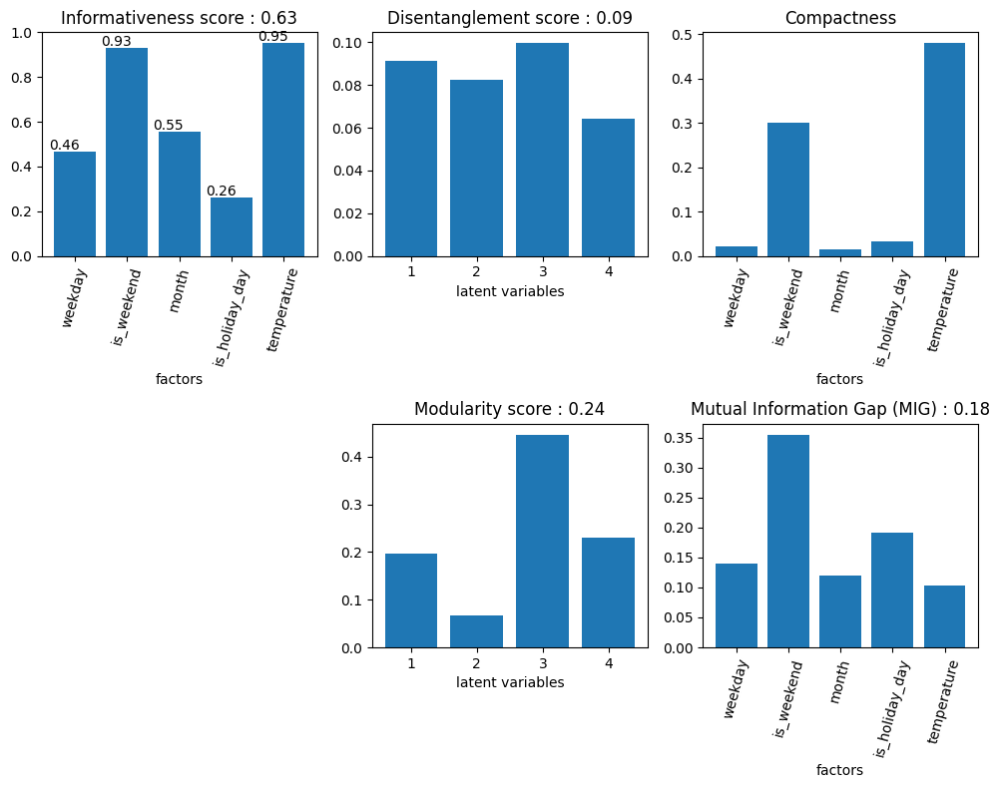

In [70]:
x_encoded_pond3 = new_cae3.encoder.predict(input_cvae)[0]
model_eval_pond3, _ =evaluate_latent_code(x_encoded_pond3, factorMatrix[train_set,:], factorDesc, orthogonalize=True, normalize_information=True)
#normalize_information normalise le score avec le minimum obtenu avec une projection aléatoire
display_evaluation_latent_code(model_eval_pond3, z_dim, factorDesc)

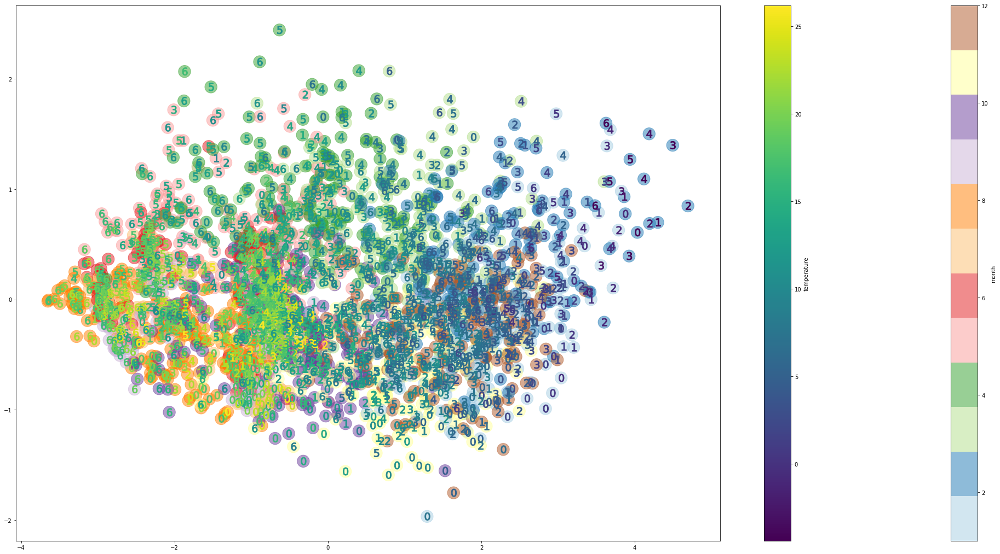

In [71]:
prez_2D(x_encoded_pond3, factorMatrix[train_set,:], temperatureMean[train_set,:])

Model: "cvae"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 x_inputs (InputLayer)          [(None, 48)]         0           []                               
                                                                                                  
 encoder (Functional)           [(None, 4),          6284        ['x_inputs[0][0]']               
                                 (None, 4)]                                                       
                                                                                                  
 reparametrizing_layer (Lambda)  (None, 4)           0           ['encoder[0][0]',                
                                                                  'encoder[0][1]']                
                                                                                               

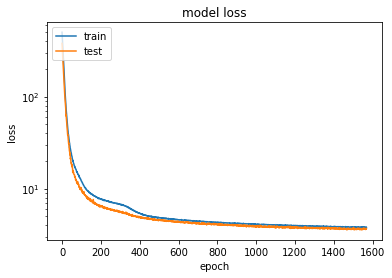

## MODEL SAVED ##


In [72]:
from src.models import CVAEpond

ponderation4 = sample_weight/sample_weight.max()*49 +1
def loss_1(y_true, y_pred, ponderation=ponderation4):
    return tf.math.reduce_sum(tf.math.square(y_true - y_pred) * ponderation, axis=-1)


custom_loss={"pond_loss" : {"function" : loss_1,
            "args" :{} }}

loss_weights = {"kl_loss" : 0.3,
                "info_loss" : 66,
               "pond_loss":1}

vae_loss = VAELoss(loss_weights = loss_weights, custom_loss=custom_loss)
vae_loss.options["log_prior_sigma"] = [-2.,-1.,0.,1]

vae_params.training_params.loss = vae_loss
vae_params.training_params.lr = 1e-5

new_cae4=CVAEpond(vae_params)
new_cae4.VAE_params.__dict__
new_cae4.build_model(vae_params)
from tensorflow.keras.callbacks import EarlyStopping
earl_stop = EarlyStopping(
    monitor='val_loss', min_delta=0, patience=100, verbose=0, mode='auto',
    baseline=None, restore_best_weights=True
)

new_cae4.train(input_cvae, output_cvae, epochs= 2000, verbose=1,
              batch_size=batch_size, callbacks=[earl_stop])

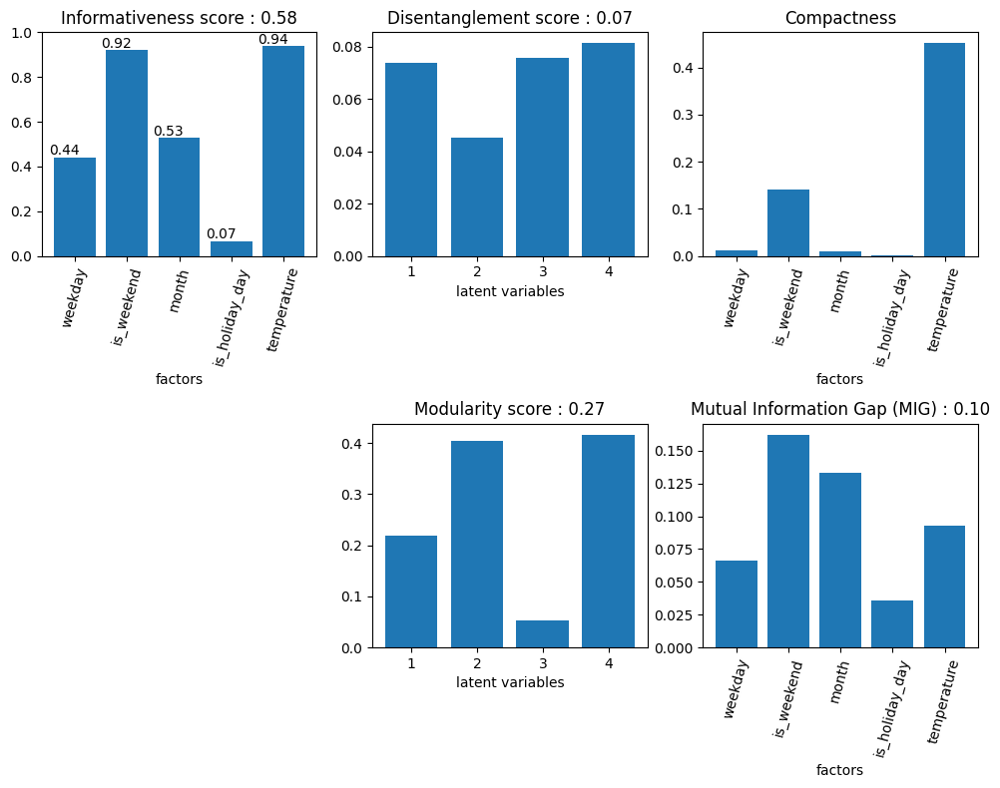

In [73]:
x_encoded_pond4 = new_cae4.encoder.predict(input_cvae)[0]
model_eval_pond4, _ =evaluate_latent_code(x_encoded_pond4, factorMatrix[train_set,:], factorDesc, orthogonalize=True, normalize_information=True)
#normalize_information normalise le score avec le minimum obtenu avec une projection aléatoire
display_evaluation_latent_code(model_eval_pond4, z_dim, factorDesc)

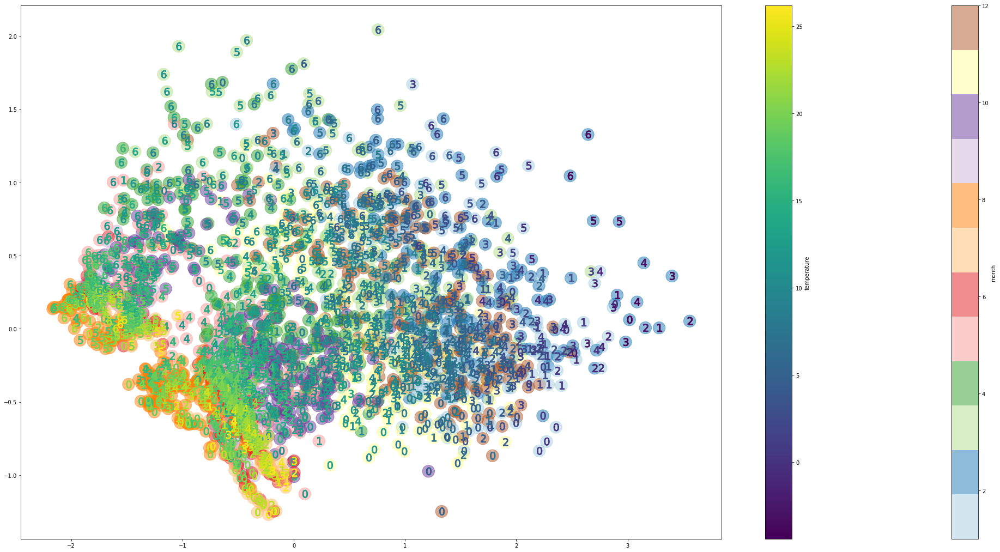

In [74]:
prez_2D(x_encoded_pond4, factorMatrix[train_set,:], temperatureMean[train_set,:])

Model: "cvae"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 x_inputs (InputLayer)          [(None, 48)]         0           []                               
                                                                                                  
 encoder (Functional)           [(None, 4),          6284        ['x_inputs[0][0]']               
                                 (None, 4)]                                                       
                                                                                                  
 reparametrizing_layer (Lambda)  (None, 4)           0           ['encoder[0][0]',                
                                                                  'encoder[0][1]']                
                                                                                               

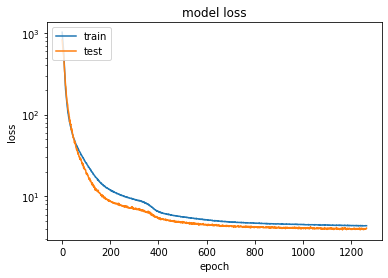

## MODEL SAVED ##


In [75]:
from src.models import CVAEpond

ponderation5 = sample_weight/sample_weight.max()*99 +1
def loss_1(y_true, y_pred, ponderation=ponderation5):
    return tf.math.reduce_sum(tf.math.square(y_true - y_pred) * ponderation, axis=-1)


custom_loss={"pond_loss" : {"function" : loss_1,
            "args" :{} }}

loss_weights = {"kl_loss" : 0.3,
                "info_loss" : 66,
               "pond_loss":1}

vae_loss = VAELoss(loss_weights = loss_weights, custom_loss=custom_loss)
vae_loss.options["log_prior_sigma"] = [-2.,-1.,0.,1]

vae_params.training_params.loss = vae_loss
vae_params.training_params.lr = 1e-5

new_cae5=CVAEpond(vae_params)
new_cae5.VAE_params.__dict__
new_cae5.build_model(vae_params)
from tensorflow.keras.callbacks import EarlyStopping
earl_stop = EarlyStopping(
    monitor='val_loss', min_delta=0, patience=100, verbose=0, mode='auto',
    baseline=None, restore_best_weights=True
)

new_cae5.train(input_cvae, output_cvae, epochs= 2000, verbose=1,
              batch_size=batch_size, callbacks=[earl_stop])

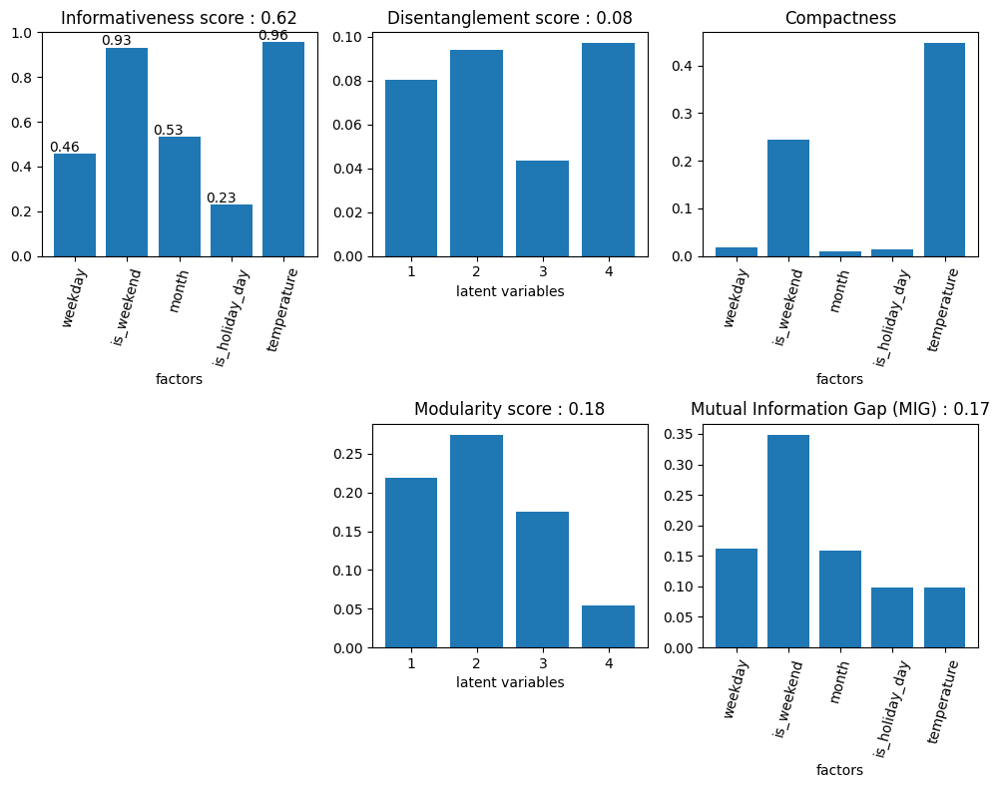

In [76]:
x_encoded_pond5 = new_cae5.encoder.predict(input_cvae)[0]
model_eval_pond5, _ =evaluate_latent_code(x_encoded_pond5, factorMatrix[train_set,:], factorDesc, orthogonalize=True, normalize_information=True)
#normalize_information normalise le score avec le minimum obtenu avec une projection aléatoire
display_evaluation_latent_code(model_eval_pond5, z_dim, factorDesc)

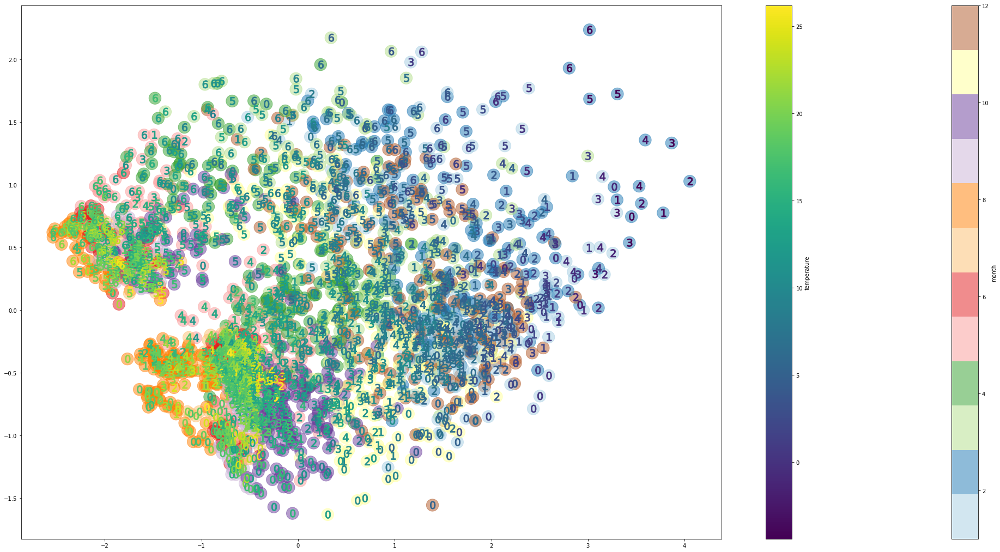

In [77]:
prez_2D(x_encoded_pond5, factorMatrix[train_set,:], temperatureMean[train_set,:])

Model: "cvae"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 x_inputs (InputLayer)          [(None, 48)]         0           []                               
                                                                                                  
 encoder (Functional)           [(None, 4),          6284        ['x_inputs[0][0]']               
                                 (None, 4)]                                                       
                                                                                                  
 reparametrizing_layer (Lambda)  (None, 4)           0           ['encoder[0][0]',                
                                                                  'encoder[0][1]']                
                                                                                               

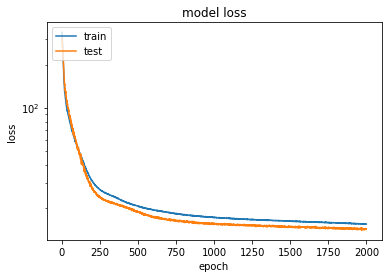

## MODEL SAVED ##


In [78]:
from src.models import CVAEpond

ponderation4 = sample_weight/sample_weight.max()*49 +1
def loss_mae(y_true, y_pred, ponderation=ponderation4):
    return tf.math.reduce_sum(tf.math.abs(y_true - y_pred) * ponderation, axis=-1)


custom_loss={"pond_loss" : {"function" : loss_mae,
            "args" :{} }}

loss_weights = {"kl_loss" : 0.3,
                "info_loss" : 66,
               "pond_loss":1}

vae_loss = VAELoss(loss_weights = loss_weights, custom_loss=custom_loss)
vae_loss.options["log_prior_sigma"] = [-2.,-1.,0.,1]

vae_params.training_params.loss = vae_loss
vae_params.training_params.lr = 1e-5

new_cae_mae=CVAEpond(vae_params)
new_cae_mae.VAE_params.__dict__
new_cae_mae.build_model(vae_params)
from tensorflow.keras.callbacks import EarlyStopping
earl_stop = EarlyStopping(
    monitor='val_loss', min_delta=0, patience=100, verbose=0, mode='auto',
    baseline=None, restore_best_weights=True
)

new_cae_mae.train(input_cvae, output_cvae, epochs= 2000, verbose=1,
              batch_size=batch_size, callbacks=[earl_stop])

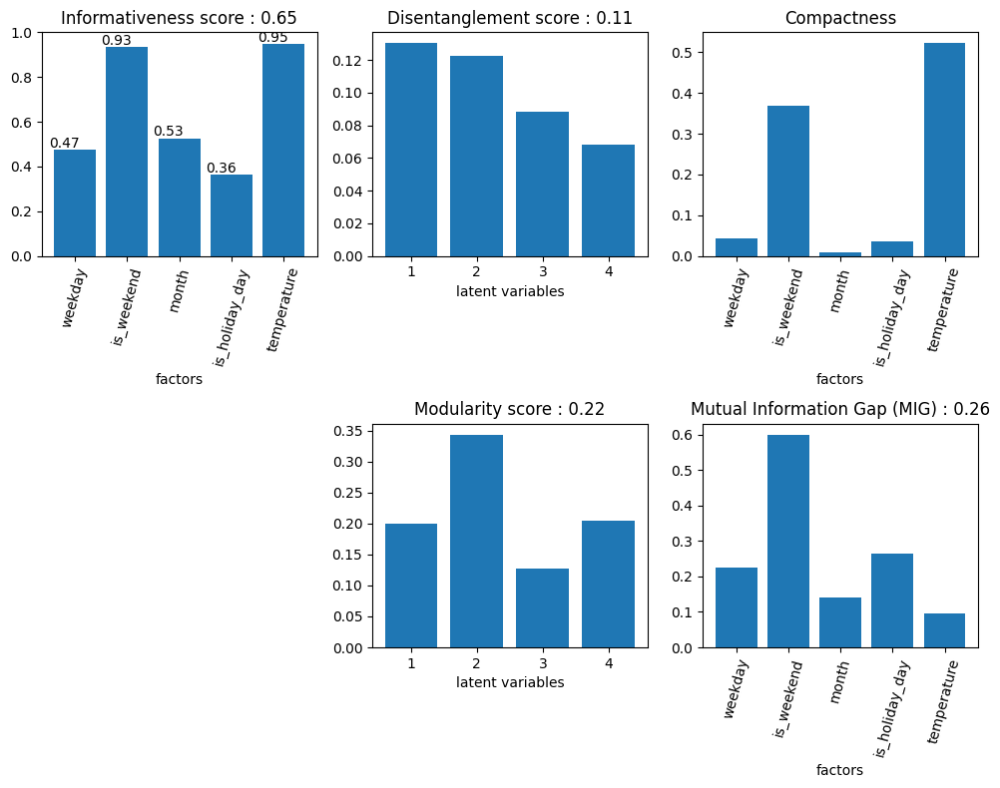

In [79]:
x_encoded_pond_mae = new_cae_mae.encoder.predict(input_cvae)[0]
model_eval_pond_mae, _ =evaluate_latent_code(x_encoded_pond_mae, factorMatrix[train_set,:], factorDesc, orthogonalize=True, normalize_information=True)
#normalize_information normalise le score avec le minimum obtenu avec une projection aléatoire
display_evaluation_latent_code(model_eval_pond_mae, z_dim, factorDesc)

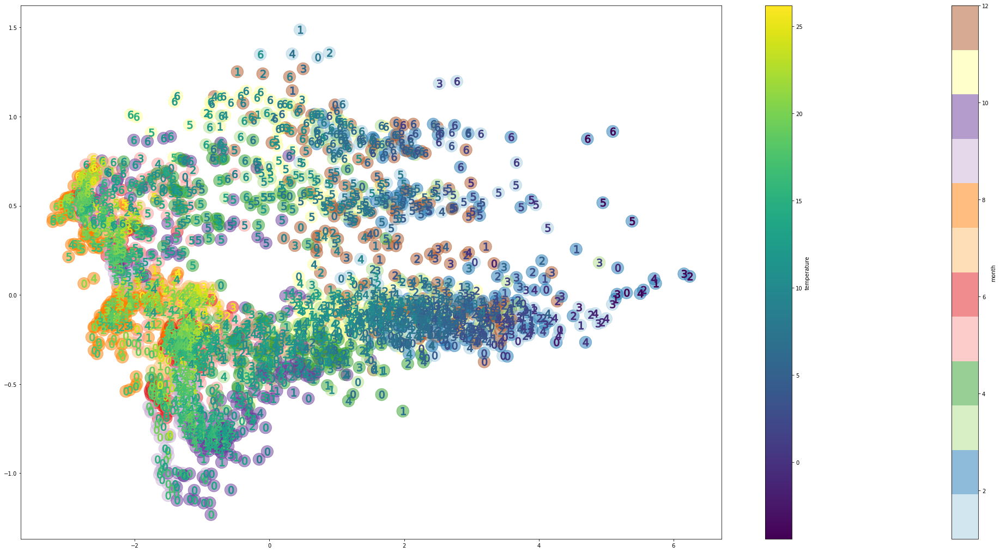

In [80]:
prez_2D(x_encoded_pond_mae, factorMatrix[train_set,:], temperatureMean[train_set,:])

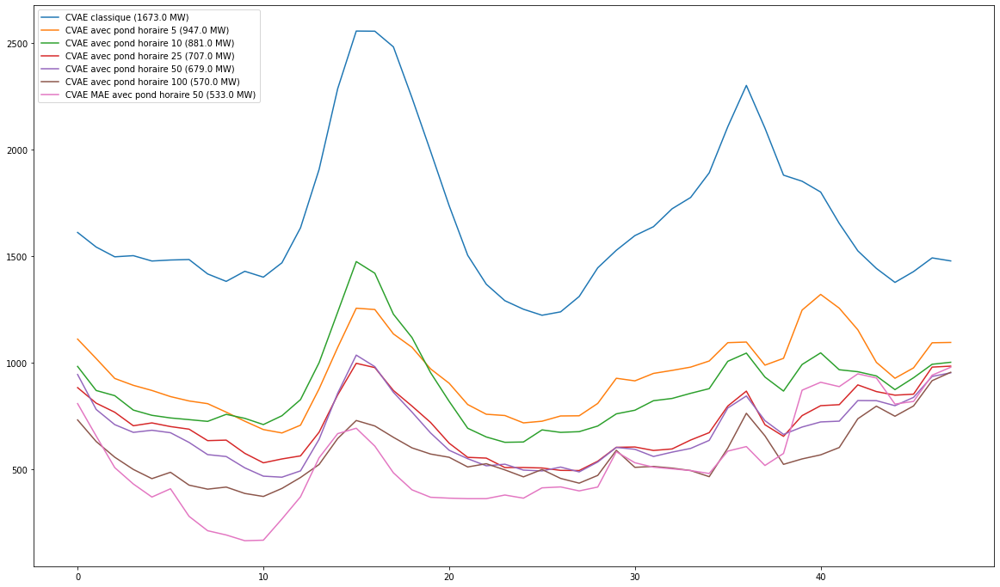

In [81]:
test_input_cvae = [df_conso.values[test_set,:]]
x_hat = new_cae.model.predict(test_input_cvae)
x_hat_pond2 = new_cae2.model.predict(test_input_cvae)
x_hat_pond3 = new_cae3.model.predict(test_input_cvae)
x_hat_pond4 = new_cae4.model.predict(test_input_cvae)
x_hat_pond5 = new_cae5.model.predict(test_input_cvae)
x_hat_pond_mae = new_cae_mae.model.predict(test_input_cvae)
# Means 
mean1 = np.floor(np.mean(np.mean(np.abs(conso_scaler.inverse_transform(x_hat) - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019].reshape(365,48)),axis=0)))
mean_pond2 = np.floor(np.mean(np.mean(np.abs(conso_scaler.inverse_transform(x_hat_pond2) - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019].reshape(365,48)),axis=0)))
mean_pond3 = np.floor(np.mean(np.mean(np.abs(conso_scaler.inverse_transform(x_hat_pond3) - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019].reshape(365,48)),axis=0)))
mean_pond4 = np.floor(np.mean(np.mean(np.abs(conso_scaler.inverse_transform(x_hat_pond4) - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019].reshape(365,48)),axis=0)))
mean_pond5 = np.floor(np.mean(np.mean(np.abs(conso_scaler.inverse_transform(x_hat_pond5) - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019].reshape(365,48)),axis=0)))
mean_pond_mae = np.floor(np.mean(np.mean(np.abs(conso_scaler.inverse_transform(x_hat_pond_mae) - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019].reshape(365,48)),axis=0)))
plt.figure(figsize=(20,12))
plt.plot(np.mean(np.abs(conso_scaler.inverse_transform(x_hat2) - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019].reshape(365,48)),axis=0), label=f'CVAE classique ({mean2} MW)')
plt.plot(np.mean(np.abs(conso_scaler.inverse_transform(x_hat) - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019].reshape(365,48)),axis=0), label=f'CVAE avec pond horaire 5 ({mean1} MW)')
plt.plot(np.mean(np.abs(conso_scaler.inverse_transform(x_hat_pond2) - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019].reshape(365,48)),axis=0), label=f'CVAE avec pond horaire 10 ({mean_pond2} MW)')
plt.plot(np.mean(np.abs(conso_scaler.inverse_transform(x_hat_pond3) - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019].reshape(365,48)),axis=0), label=f'CVAE avec pond horaire 25 ({mean_pond3} MW)')
plt.plot(np.mean(np.abs(conso_scaler.inverse_transform(x_hat_pond4) - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019].reshape(365,48)),axis=0), label=f'CVAE avec pond horaire 50 ({mean_pond4} MW)')
plt.plot(np.mean(np.abs(conso_scaler.inverse_transform(x_hat_pond5) - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019].reshape(365,48)),axis=0), label=f'CVAE avec pond horaire 100 ({mean_pond5} MW)')
plt.plot(np.mean(np.abs(conso_scaler.inverse_transform(x_hat_pond_mae) - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019].reshape(365,48)),axis=0), label=f'CVAE MAE avec pond horaire 50 ({mean_pond_mae} MW)')
plt.legend(loc='upper left')
plt.show()

In [84]:
def compare_metrics(list_models, name_models, z_dim, factorDesc):
    
    dict_metrics = {}
    fig, axs = plt.subplots(5,1,figsize=(10,18))
    i=0
    
    for key in list_models[0].keys():
        if key != 'mean_disentanglement':
            
            print(key)
            data = {}
            if list_models[0][key].shape[0] == 5:
                n_factors = len(list(factorDesc))
                tmp = np.zeros((n_factors*len(name_models),3), dtype='object')
                tmp[:,0] = list(factorDesc)*len(list_models)
                
            else : 
                n_factors = z_dim
                tmp = np.zeros((n_factors*len(name_models),3), dtype='object')
                tmp[:,0] = list(np.arange(1,z_dim+1))*len(list_models)
               
            for id, name in enumerate(name_models):
                tmp[id*n_factors:(id+1)*n_factors,1]= list_models[id][key]
                tmp[id*n_factors:(id+1)*n_factors,2]= [name]*n_factors
            dict_metrics[key] = pd.DataFrame(data=tmp, columns=['Variable',key,'Modeles'])
            sn.barplot(ax=axs[i], x=dict_metrics[key].Variable, y=dict_metrics[key][key], hue=dict_metrics[key].Modeles)
            i+=1
    plt.show()

    return dict_metrics

informativeness
disentanglement
compactness
mig
modularity


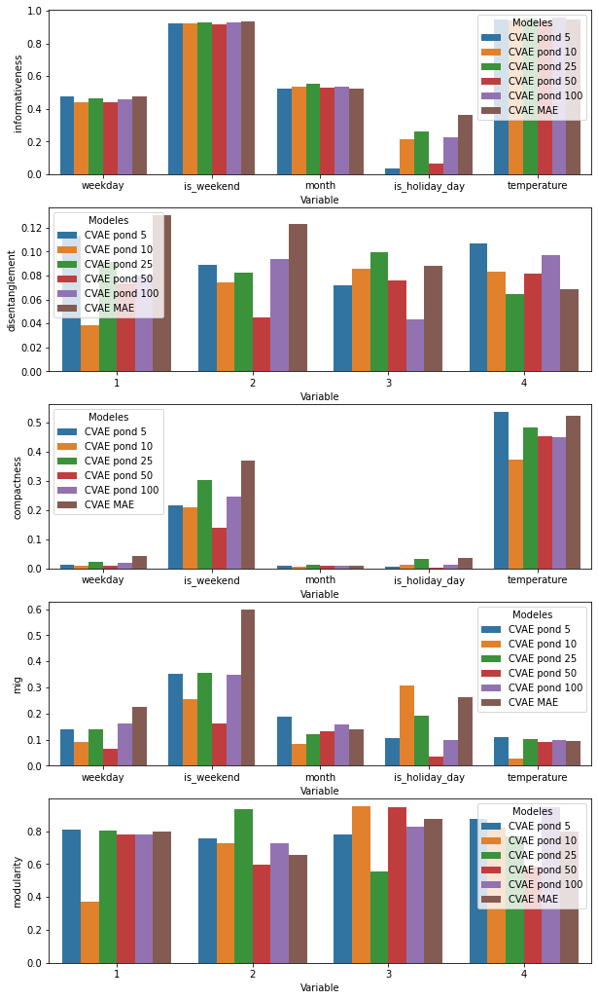

{'informativeness':           Variable informativeness        Modeles
 0          weekday        0.474155    CVAE pond 5
 1       is_weekend        0.923165    CVAE pond 5
 2            month        0.524932    CVAE pond 5
 3   is_holiday_day        0.037044    CVAE pond 5
 4      temperature        0.944694    CVAE pond 5
 5          weekday        0.440942   CVAE pond 10
 6       is_weekend        0.924527   CVAE pond 10
 7            month        0.532994   CVAE pond 10
 8   is_holiday_day        0.216003   CVAE pond 10
 9      temperature        0.938123   CVAE pond 10
 10         weekday        0.464712   CVAE pond 25
 11      is_weekend        0.929317   CVAE pond 25
 12           month        0.553265   CVAE pond 25
 13  is_holiday_day         0.26129   CVAE pond 25
 14     temperature        0.951753   CVAE pond 25
 15         weekday        0.441516   CVAE pond 50
 16      is_weekend        0.919511   CVAE pond 50
 17           month        0.528608   CVAE pond 50
 18  is_holi

In [85]:
compare_metrics([model_eval_pond1, model_eval_pond2,model_eval_pond3,model_eval_pond4,model_eval_pond5, model_eval_pond_mae], 
                ['CVAE pond 5', 'CVAE pond 10', 'CVAE pond 25','CVAE pond 50','CVAE pond 100','CVAE MAE'], 4, factorDesc)

In [43]:
def create_and_train_pondCVAE(sample_weight, max_pond, z_dim):

    ponderation = (sample_weight-sample_weight.min())/(sample_weight.max()-sample_weight.min())*(max_pond-1) + 1
    def loss(y_true, y_pred, ponderation=ponderation):
        return tf.math.reduce_sum(tf.math.square(y_true - y_pred) * ponderation, axis=-1)

    custom_loss={"pond_loss" : {"function" : loss,
                "args" :{} }}

    loss_weights = {"kl_loss" : 0.3,
                    "info_loss" : 66,
                    "pond_loss": 1}

    vae_params = VAE_params(name=name_model, out_dir = log_dir_model)
    vae_params.set_model_params()
    vae_params.set_training_params()
    vae_params.model_params.encoder_dims = e_dims
    vae_params.model_params.decoder_dims = d_dims
    vae_params.model_params.latent_dims = z_dim
    vae_params.model_params.cond_dims = []
    vae_params.model_params.emb_dims = []
    vae_params.model_params.with_embedding = False
    vae_params.model_params.with_Time2Vec = False
    vae_params.model_params.nb_encoder_ensemble = 1

    vae_loss = VAELoss(loss_weights = loss_weights, custom_loss=custom_loss)
    vae_loss.options["log_prior_sigma"] = [-2.,-1.,0.,1]

    vae_params.training_params.loss = vae_loss
    vae_params.training_params.lr = 1e-5

    cvae = CVAEpond(vae_params)
    cvae.build_model(vae_params)
    earl_stop = EarlyStopping(
        monitor='val_loss', min_delta=0, patience=100, verbose=0, mode='auto',
        baseline=None, restore_best_weights=True)

    cvae.train(input_cvae, output_cvae, epochs= 4000, verbose=0,
                      batch_size=batch_size, callbacks=[earl_stop])
    return cvae

In [44]:
def create_dict(list_metrics = ['MAE','MIG','Modularity','Disentanglement','M score','W score','is_W score','H score','T score']): 
    dict = {metric: [] for metric in list_metrics}
    return dict 

def create_metric_dict(n_iterations, list_pond, sample_weight=sample_weight, z_dim=z_dim, input_cvae=input_cvae, factorMatrix=factorMatrix, factorDesc=factorDesc):
    '''
    This function is used to evaluate a list of CVAE with ponderate MSE.
    To obtain significant metrics, n_iterations CVAEpond are trained. The mean and the standard deviation of these metrics will be used for the table creation. 
    '''
    name_models = ['CVAEpond '+str(pond) for pond in list_pond]
    models = {name: [] for name in name_models}
    dict_metrics = {model: create_dict() for model in name_models}

    for i in range(n_iterations):
        for id_model, model in enumerate(name_models):

            # Model creation 
            models[model].append(create_and_train_pondCVAE(sample_weight = sample_weight, max_pond = list_pond[id_model], z_dim = z_dim))
            cvae = models[model][-1]
            # Model evaluation
            x_encoded = cvae.encoder.predict(input_cvae)[0] 
            model_eval, _ = evaluate_latent_code(x_encoded, factorMatrix[train_set,:], factorDesc, orthogonalize=True, normalize_information=True)
            dict_metrics[model]['MIG'].append(model_eval['mig'].mean())
            dict_metrics[model]['Modularity'].append(model_eval['modularity'].mean())
            dict_metrics[model]['Disentanglement'].append(model_eval['mean_disentanglement'])
            dict_metrics[model]['M score'].append(model_eval['informativeness'][0])
            dict_metrics[model]['W score'].append(model_eval['informativeness'][1])
            dict_metrics[model]['is_W score'].append(model_eval['informativeness'][2])
            dict_metrics[model]['H score'].append(model_eval['informativeness'][3])
            dict_metrics[model]['T score'].append(model_eval['informativeness'][4])

            # Save MAE loss per time step to test the robustness of errors. 
            # Only the mean of this profile will be kept in the table
            test_input_cvae = [df_conso.values[test_set,:]]
            x_hat = cvae.model.predict(test_input_cvae)
            mae = np.mean(np.abs(conso_scaler.inverse_transform(x_hat) - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019].reshape(365,48)),axis=0)
            dict_metrics[model]['MAE'].append(mae)
    return dict_metrics, models

def create_metric_dict(n_iterations, list_pond, sample_weight=sample_weight, z_dim=z_dim, input_cvae=input_cvae, factorMatrix=factorMatrix, factorDesc=factorDesc):
    '''
    This function is used to evaluate a list of CVAE with ponderate MSE.
    To obtain significant metrics, n_iterations CVAEpond are trained. The mean and the standard deviation of these metrics will be used for the table creation. 
    '''
    name_models = ['CVAEpond '+str(pond) for pond in list_pond]
    models = {name: [] for name in name_models}
    dict_metrics = {model: create_dict() for model in name_models}

    for i in range(n_iterations):
        for id_model, model in enumerate(name_models):

            # Model creation 
            models[model].append(create_and_train_pondCVAE(sample_weight = sample_weight, max_pond = list_pond[id_model], z_dim = z_dim))
            cvae = models[model][-1]
            # Model evaluation
            x_encoded = cvae.encoder.predict(input_cvae)[0] 
            model_eval, _ = evaluate_latent_code(x_encoded, factorMatrix[train_set,:], factorDesc, orthogonalize=True, normalize_information=True)
            dict_metrics[model]['MIG'].append(model_eval['mig'].mean())
            dict_metrics[model]['Modularity'].append(model_eval['modularity'].mean())
            dict_metrics[model]['Disentanglement'].append(model_eval['mean_disentanglement'])
            dict_metrics[model]['M score'].append(model_eval['informativeness'][0])
            dict_metrics[model]['W score'].append(model_eval['informativeness'][1])
            dict_metrics[model]['is_W score'].append(model_eval['informativeness'][2])
            dict_metrics[model]['H score'].append(model_eval['informativeness'][3])
            dict_metrics[model]['T score'].append(model_eval['informativeness'][4])

            # Save MAE loss per time step to test the robustness of errors. 
            # Only the mean of this profile will be kept in the table
            test_input_cvae = [df_conso.values[test_set,:]]
            x_hat = cvae.model.predict(test_input_cvae)
            mae = np.mean(np.abs(conso_scaler.inverse_transform(x_hat) - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019].reshape(365,48)),axis=0)
            dict_metrics[model]['MAE'].append(mae)
    return dict_metrics, models

def create_metric_table(dict_metrics, list_metrics=['MAE','MIG','Modularity','Disentanglement','M score','W score','is_W score','H score','T score']):

    data = {metrics: {'mean': [], 'std':[]} for metrics in list_metrics}

    for name_model in dict_metrics.keys():
        data['MAE']['mean'].append(np.array(dict_metrics[name_model]['MAE']).mean())
        data['MAE']['std'].append(np.array(dict_metrics[name_model]['MAE']).std())

        for metric in list_metrics[1:]:
            data[metric]['mean'].append(np.array(dict_metrics[name_model][metric]).mean())
            data[metric]['std'].append(np.array(dict_metrics[name_model][metric]).std())
    return data


Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  False
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003
Model: "cvae"
_____________________________________________________________________________________________

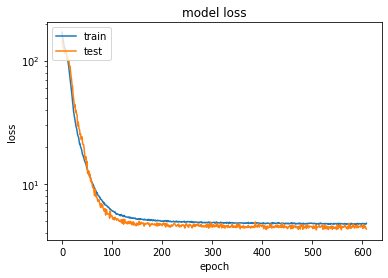

## MODEL SAVED ##
Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  False
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003
Model: "cvae"
___________________________________________________________________________

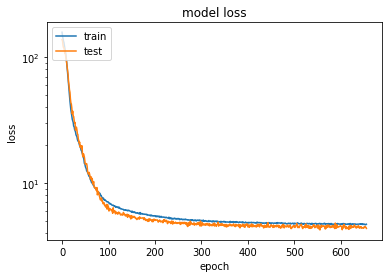

## MODEL SAVED ##
Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  False
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003
Model: "cvae"
___________________________________________________________________________

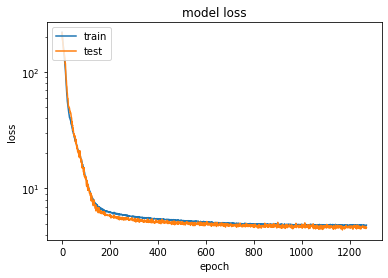

## MODEL SAVED ##
Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  False
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003
Model: "cvae"
___________________________________________________________________________

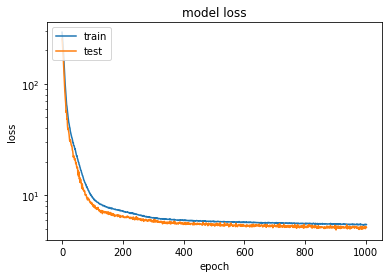

## MODEL SAVED ##
Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  False
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003
Model: "cvae"
___________________________________________________________________________

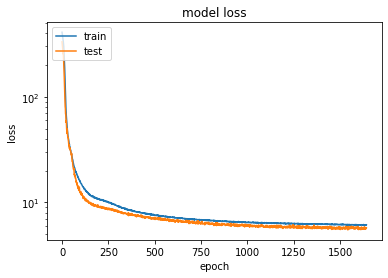

## MODEL SAVED ##
Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  False
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003
Model: "cvae"
___________________________________________________________________________

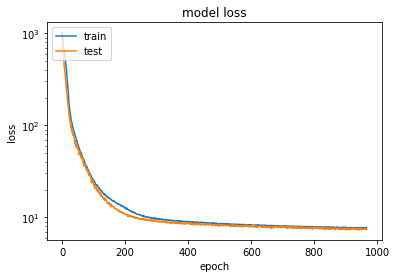

## MODEL SAVED ##
Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  False
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003
Model: "cvae"
___________________________________________________________________________

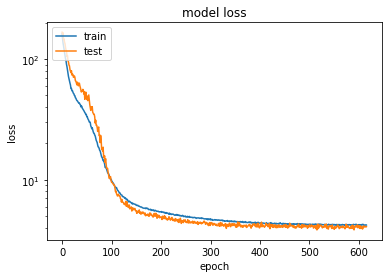

## MODEL SAVED ##
Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  False
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003
Model: "cvae"
___________________________________________________________________________

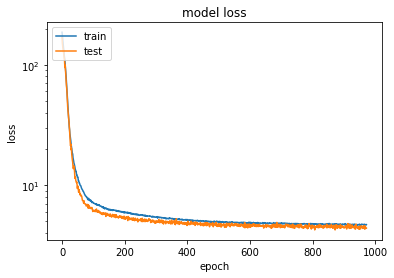

## MODEL SAVED ##
Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  False
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003
Model: "cvae"
___________________________________________________________________________

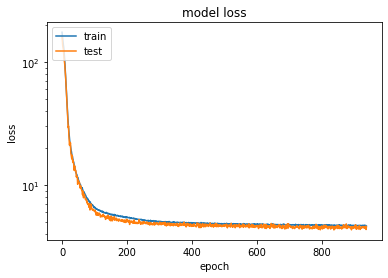

## MODEL SAVED ##
Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  False
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003
Model: "cvae"
___________________________________________________________________________

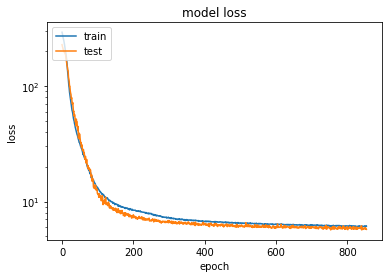

## MODEL SAVED ##
Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  False
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003
Model: "cvae"
___________________________________________________________________________

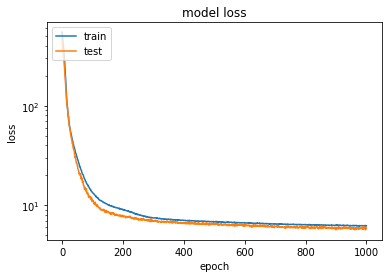

## MODEL SAVED ##
Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  False
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003
Model: "cvae"
___________________________________________________________________________

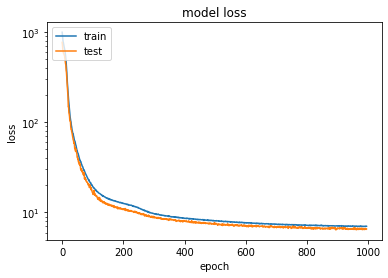

## MODEL SAVED ##
Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  False
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003
Model: "cvae"
___________________________________________________________________________

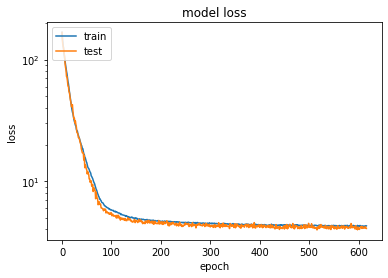

## MODEL SAVED ##
Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  False
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003
Model: "cvae"
___________________________________________________________________________

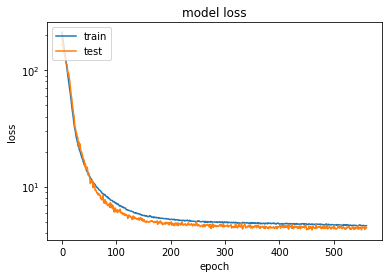

## MODEL SAVED ##
Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  False
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003
Model: "cvae"
___________________________________________________________________________

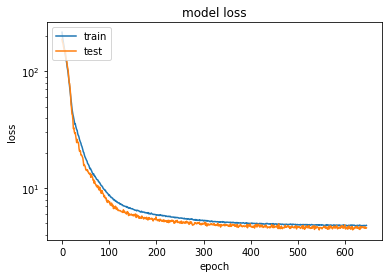

## MODEL SAVED ##
Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  False
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003
Model: "cvae"
___________________________________________________________________________

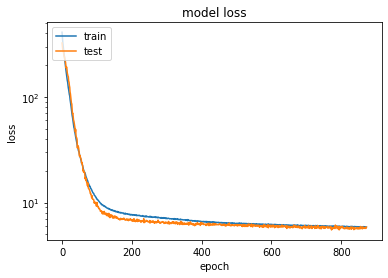

## MODEL SAVED ##
Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  False
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003
Model: "cvae"
___________________________________________________________________________

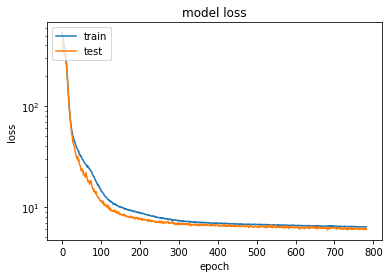

## MODEL SAVED ##
Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  False
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003
Model: "cvae"
___________________________________________________________________________

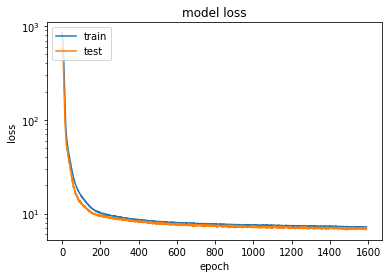

## MODEL SAVED ##
Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  False
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003
Model: "cvae"
___________________________________________________________________________

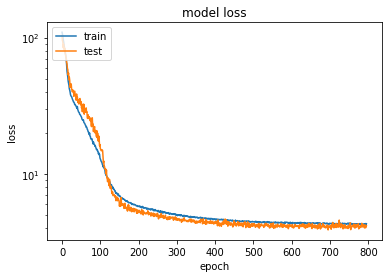

## MODEL SAVED ##
Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  False
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003
Model: "cvae"
___________________________________________________________________________

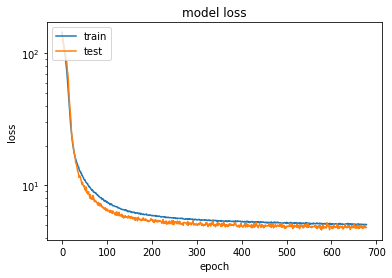

## MODEL SAVED ##
Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  False
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003
Model: "cvae"
___________________________________________________________________________

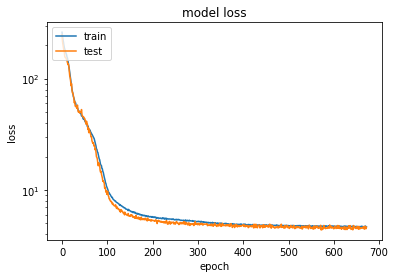

## MODEL SAVED ##
Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  False
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003
Model: "cvae"
___________________________________________________________________________

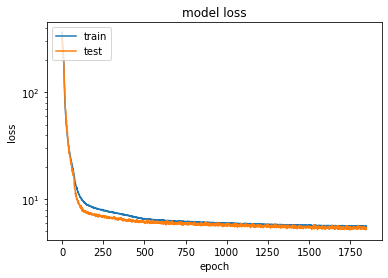

## MODEL SAVED ##
Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  False
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003
Model: "cvae"
___________________________________________________________________________

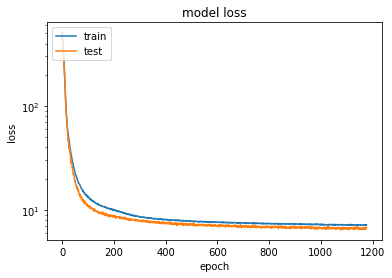

## MODEL SAVED ##
Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  False
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003
Model: "cvae"
___________________________________________________________________________

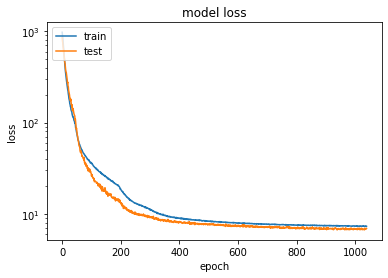

## MODEL SAVED ##
Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  False
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003
Model: "cvae"
___________________________________________________________________________

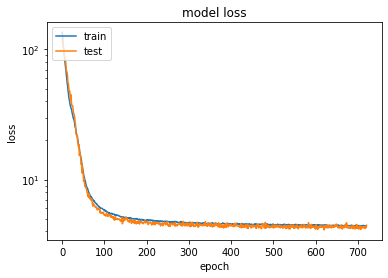

## MODEL SAVED ##
Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  False
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003
Model: "cvae"
___________________________________________________________________________

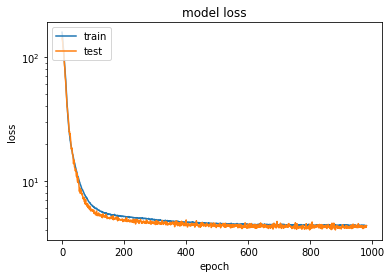

## MODEL SAVED ##
Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  False
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003
Model: "cvae"
___________________________________________________________________________

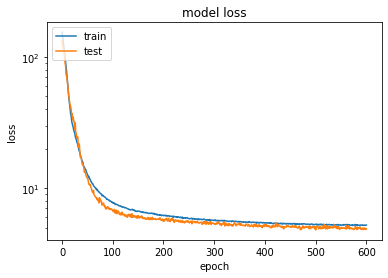

## MODEL SAVED ##
Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  False
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003
Model: "cvae"
___________________________________________________________________________

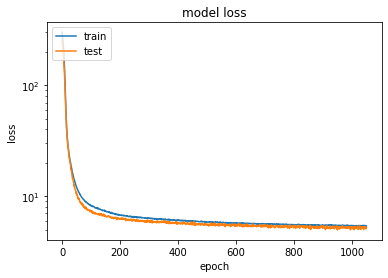

## MODEL SAVED ##
Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  False
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003
Model: "cvae"
___________________________________________________________________________

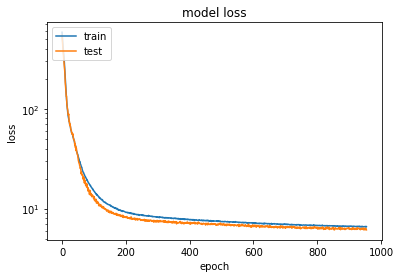

## MODEL SAVED ##
Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  False
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003
Model: "cvae"
___________________________________________________________________________

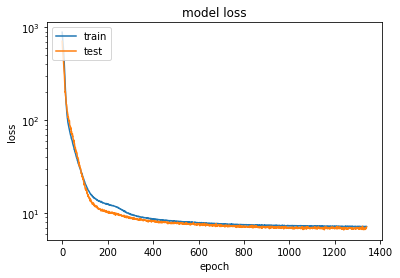

## MODEL SAVED ##


In [45]:
dict_metrics, models = create_metric_dict(n_iterations=5, list_pond=[1, 5, 10, 25, 50, 100], 
                                                          sample_weight=sample_weight,
                                                          z_dim= z_dim, 
                                                          input_cvae=input_cvae,
                                                          factorMatrix = factorMatrix,
                                                          factorDesc=factorDesc)

In [47]:
dict_metrics

{'CVAEpond 1': {'MAE': [array([1415.63772474, 1330.93860231, 1278.95604666, 1285.77943065,
          1264.0531464 , 1288.82040882, 1251.36075557, 1234.19967359,
          1188.02104024, 1153.49599208, 1121.71688784, 1188.73607128,
          1335.84463827, 1600.06153146, 1878.36710188, 2069.37023223,
          2006.24413527, 1895.94819135, 1737.43377568, 1514.86855736,
          1281.23055437, 1096.42692637, 1022.13160317,  971.21948844,
           988.3734589 ,  962.02819991, 1028.53243793, 1064.79415668,
          1123.6677119 , 1282.81476884, 1287.93112158, 1345.47573844,
          1402.2640839 , 1484.29231592, 1551.64536601, 1798.73251284,
          2008.06558219, 1831.35132705, 1694.80368151, 1691.24641481,
          1729.34384632, 1571.08025471, 1451.25316781, 1286.67767551,
          1137.55881849, 1158.22956978, 1282.55697774, 1309.93287671]),
   array([1218.84097817, 1156.49423159, 1104.26122646, 1138.45950342,
          1128.21858947, 1130.92523545, 1117.07056935, 1111.8394263

In [90]:
name_models = list(dict_metrics.keys())
for i in range(5):
        for id_model, model in enumerate(name_models):

            # Model creation 
            test_model = models[model][i]
            # Model evaluation
            x_encoded = test_model.encoder.predict(input_cvae)[0] 
            model_eval, _ = evaluate_latent_code(x_encoded, factorMatrix[train_set,:], factorDesc, orthogonalize=True, normalize_information=True)
            dict_metrics[model]['Modularity'][i] = model_eval['modularity'].mean()
            

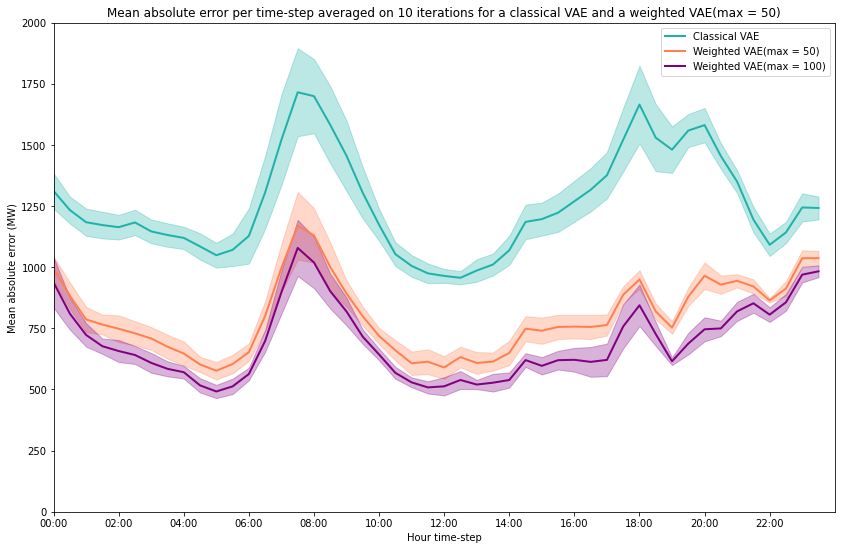

In [71]:
n_iterations = np.array(dict_metrics['CVAEpond 1']['MAE']).shape[0]

mean_classique = np.array(dict_metrics['CVAEpond 1']['MAE']).mean(axis=0)
ci_classique = 1.96 * np.array(dict_metrics['CVAEpond 1']['MAE']).std(axis=0)/np.sqrt(n_iterations)
mean_pond = np.array(dict_metrics['CVAEpond 50']['MAE']).mean(axis=0)
ci_pond = 1.96 * np.array(dict_metrics['CVAEpond 50']['MAE']).std(axis=0)/np.sqrt(n_iterations)
mean_pond100 = np.array(dict_metrics['CVAEpond 100']['MAE']).mean(axis=0)
ci_pond100 = 1.96 * np.array(dict_metrics['CVAEpond 100']['MAE']).std(axis=0)/np.sqrt(n_iterations)

fig, ax = plt.subplots(figsize=(14,9))
ax.plot(np.arange(mean_classique.shape[0]), mean_classique, label='Classical VAE', color='lightseagreen', linewidth=2)
ax.fill_between(np.arange(mean_classique.shape[0]), (mean_classique-ci_classique), (mean_classique+ci_classique), color='lightseagreen', alpha=.3, linewidth=1)
ax.plot(np.arange(mean_pond.shape[0]), mean_pond, label='Weighted VAE(max = 50)', color='coral', linewidth=2)
ax.fill_between(np.arange(mean_pond.shape[0]), (mean_pond-ci_pond), (mean_pond+ci_pond), color='coral', alpha=.3, linewidth=1)
ax.plot(np.arange(mean_pond100.shape[0]), mean_pond100, label='Weighted VAE(max = 100)', color='purple', linewidth=2)
ax.fill_between(np.arange(mean_pond100.shape[0]), (mean_pond100-ci_pond100), (mean_pond100+ci_pond100), color='purple', alpha=.3, linewidth=1)
plt.legend()
plt.xlabel('Hour time-step')
plt.ylabel('Mean absolute error (MW)')
plt.title('Mean absolute error per time-step averaged on 10 iterations for a classical VAE and a weighted VAE(max = 50)')
plt.ylim((0,2000))
index = pd.date_range("00:00", "23:30", freq="30min").strftime('%H:%M').to_list()
ax.set_xlim((0,48))
ax.set_xticks(np.arange(48), index)
ax.locator_params(axis="x", nbins=12)


In [49]:
df_metrics = create_metric_table(dict_metrics)

In [50]:
df_metrics

{'MAE': {'mean': [1257.7182912608805,
   1125.6305595168024,
   1029.558017511237,
   903.0095980932506,
   797.4120051860375,
   696.1955822363727],
  'std': [229.2680366370513,
   205.85450354266646,
   172.4869164163321,
   175.56785557308177,
   163.27081129309667,
   163.5423524707422]},
 'MIG': {'mean': [0.21494714045326982,
   0.14696465680828769,
   0.20207721375419543,
   0.16042249408650258,
   0.1763508811992261,
   0.2028160485625393],
  'std': [0.056249528870116645,
   0.08055071641113758,
   0.026144548663427365,
   0.07979413781843607,
   0.017753634089571372,
   0.04701800841260302]},
 'Modularity': {'mean': [0.8008165414232609,
   0.7637296323216971,
   0.7843717471536431,
   0.7471900279951238,
   0.7971261078743129,
   0.8102577417418388],
  'std': [0.014777754085354039,
   0.05486261650683281,
   0.027622759786091904,
   0.031696318361754815,
   0.034786875441978,
   0.02906703451924246]},
 'Disentanglement': {'mean': [0.11090871925135044,
   0.08024373621281888,
  

In [72]:
models.keys()

dict_keys(['CVAEpond 1', 'CVAEpond 5', 'CVAEpond 10', 'CVAEpond 25', 'CVAEpond 50', 'CVAEpond 100'])

In [61]:
test_model = models['CVAEpond 100'][0]

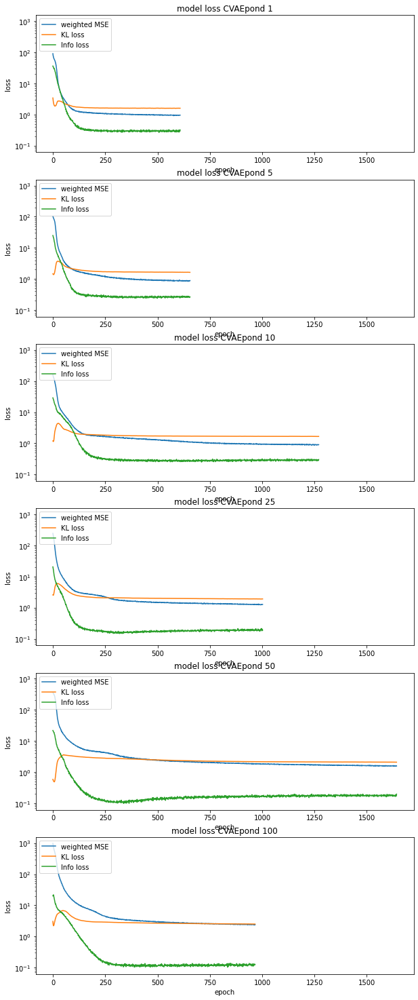

In [91]:
fig= plt.figure(figsize=(10,26)) # plt.subplots(1,6,figsize=(26,10))
ax1 = fig.add_subplot(6, 1, 1)
ax2 = fig.add_subplot(6, 1, 2, sharey=ax1, sharex = ax1)
ax3 = fig.add_subplot(6, 1, 3, sharey=ax2, sharex = ax1)
ax4 = fig.add_subplot(6, 1, 4, sharey=ax3, sharex = ax1)
ax5 = fig.add_subplot(6, 1, 5, sharey=ax4, sharex = ax1)
ax6 = fig.add_subplot(6, 1, 6, sharey=ax5, sharex = ax1)
axs = [ax1, ax2, ax3, ax4, ax5, ax6]
for i, key in enumerate(models.keys()):
    axs[i].plot(models[key][0].training_history.history['pond_loss'])
    axs[i].plot(models[key][0].training_history.history['kl_loss'])
    axs[i].plot(models[key][0].training_history.history['info_loss'])
    axs[i].set_title('model loss '+key)
    axs[i].set_ylabel('loss')
    axs[i].set_xlabel('epoch')
    axs[i].set_yscale('log')
    axs[i].legend(['weighted MSE', 'KL loss', 'Info loss'], loc='upper right')

In [97]:
x_encoded = test_model.encoder.predict(input_cvae)[0] 
model_eval, _ = evaluate_latent_code(x_encoded, factorMatrix[train_set,:], factorDesc, orthogonalize=True, normalize_information=True)
model_eval['mig'].mean()

0.19504287462143413

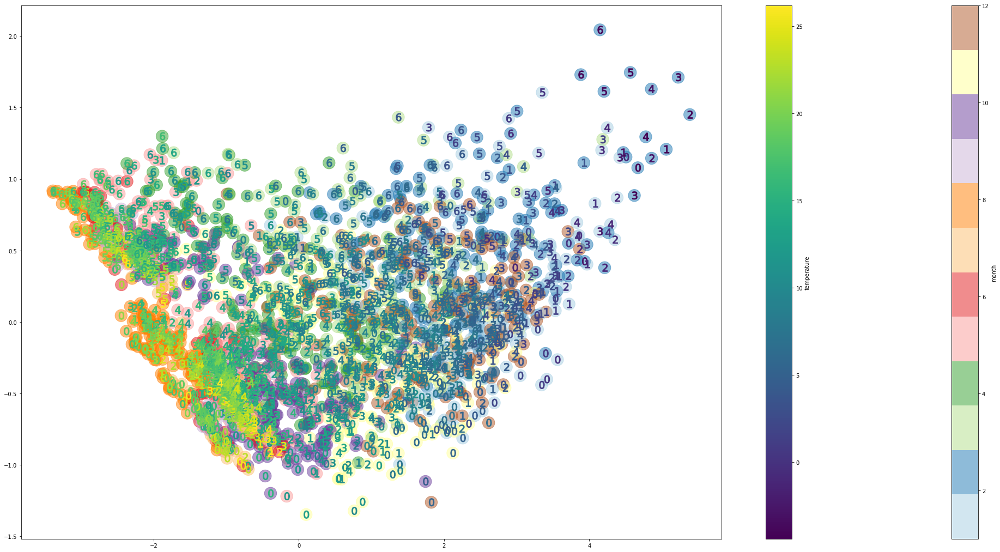

In [63]:
prez_2D(x_encoded, factorMatrix[train_set,:], temperatureMean[train_set,:])

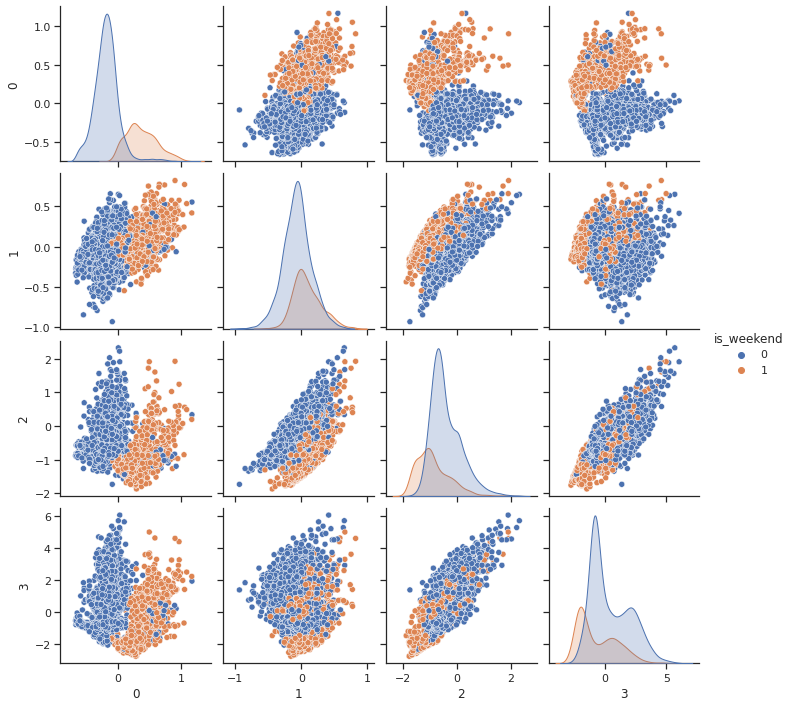

In [98]:
#TODO: Gridplot 3D
data = {i: x_encoded[:,i] for i in range(x_encoded.shape[1])}
data['is_weekend'] = df_calendar.is_weekend[train_set]
z=pd.DataFrame(data=data)

import seaborn as sns
sns.set_theme(style="ticks")
sns.pairplot(z, hue='is_weekend')

In [64]:
models_errors = {}

In [65]:
pond_error = (mean_pond - mean_pond.min())/(mean_pond.max() - mean_pond.min())*49 +1

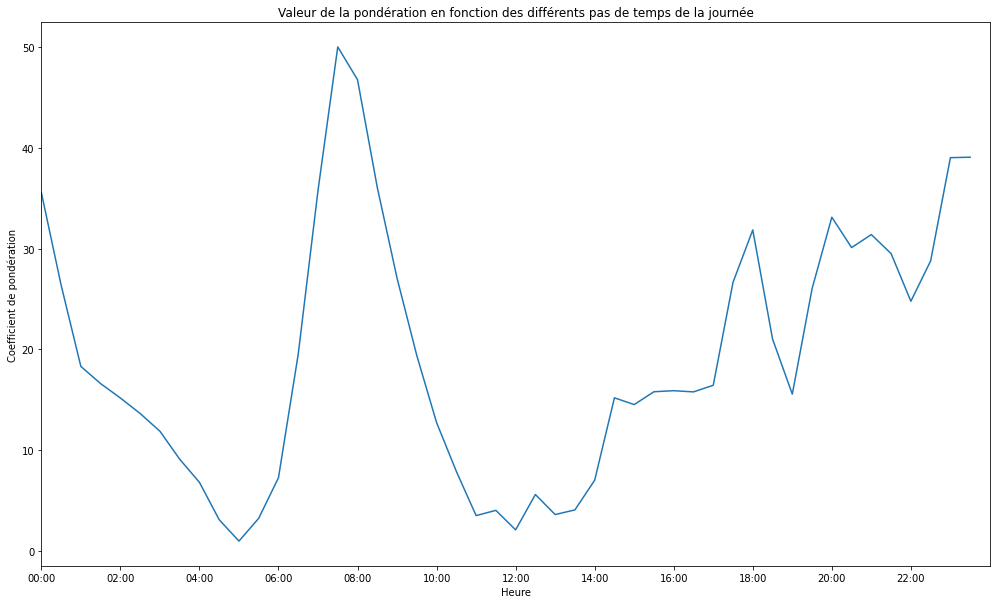

In [66]:
plt.figure(figsize=(17,10))
plt.plot(pond_error)
plt.xlim((0,48))
plt.xticks(np.arange(48), index)
plt.locator_params(axis="x", nbins=12)
plt.ylabel("Coefficient de pondération")
plt.xlabel("Heure")
plt.title("Valeur de la pondération en fonction des différents pas de temps de la journée")
plt.show()

## Naissance de l'EAVAE: pondération de l'erreur de reconstruction sur les erreurs commises par l'Info-VAE

Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  False
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003
Model: "cvae"
_____________________________________________________________________________________________

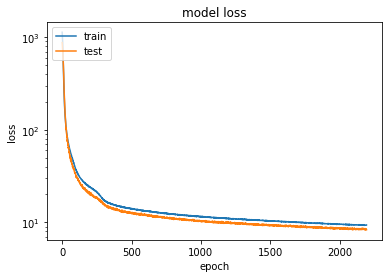

## MODEL SAVED ##
Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  False
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003
Model: "cvae"
___________________________________________________________________________

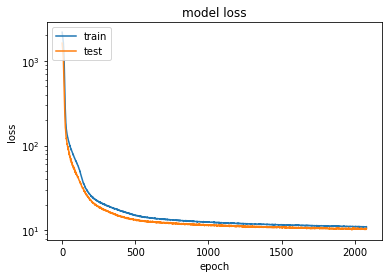

## MODEL SAVED ##
Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  False
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003
Model: "cvae"
___________________________________________________________________________

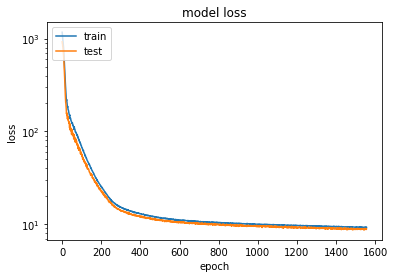

## MODEL SAVED ##
Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  False
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003
Model: "cvae"
___________________________________________________________________________

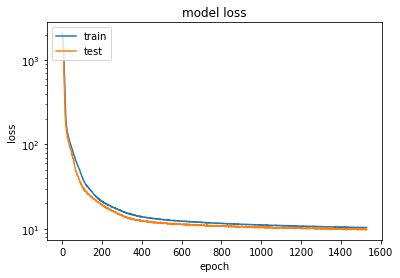

## MODEL SAVED ##
Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  False
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003
Model: "cvae"
___________________________________________________________________________

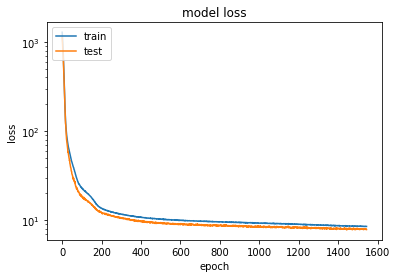

## MODEL SAVED ##
Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  False
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003
Model: "cvae"
___________________________________________________________________________

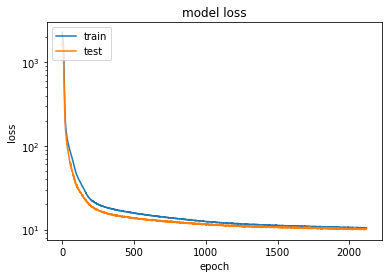

## MODEL SAVED ##
Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  False
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003
Model: "cvae"
___________________________________________________________________________

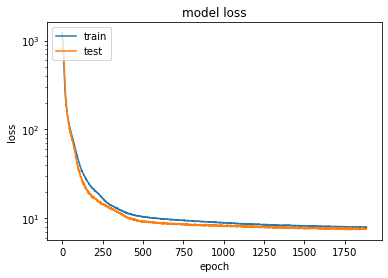

## MODEL SAVED ##
Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  False
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003
Model: "cvae"
___________________________________________________________________________

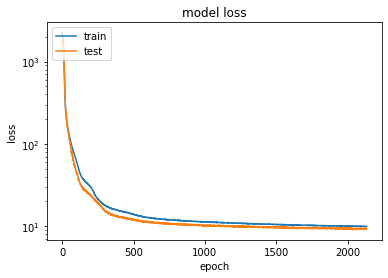

## MODEL SAVED ##
Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  False
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003
Model: "cvae"
___________________________________________________________________________

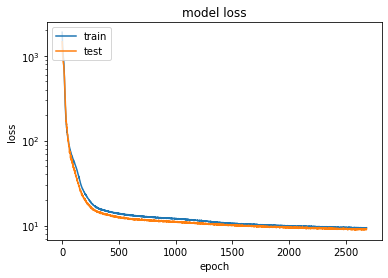

## MODEL SAVED ##
Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  False
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003
Model: "cvae"
___________________________________________________________________________

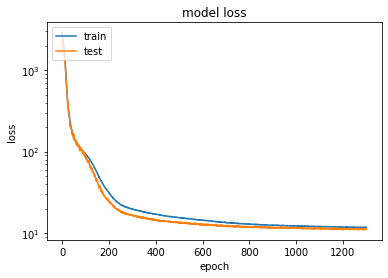

## MODEL SAVED ##


In [92]:
dict_metrics_errors, models_errors = create_metric_dict(n_iterations=5, list_pond=[50, 100], 
                                                                        sample_weight=np.array(dict_metrics['CVAEpond 100']['MAE']).mean(axis=0),
                                                                        z_dim= z_dim, 
                                                                        input_cvae=input_cvae,
                                                                        factorMatrix = factorMatrix,
                                                                        factorDesc=factorDesc)

In [93]:
dict_metrics_errors

{'CVAEpond 50': {'MAE': [array([692.85845462, 594.5208155 , 524.64924015, 499.18525257,
          490.60082406, 475.6994863 , 457.40765197, 454.62905608,
          441.30338185, 446.71651327, 416.77938249, 446.2049604 ,
          464.89303831, 473.51111943, 490.26202911, 487.55697774,
          460.41052012, 467.12151113, 510.90211901, 536.49262628,
          557.95850813, 568.1296661 , 582.99491652, 598.86349529,
          608.88685788, 621.82221747, 652.43994007, 637.14175942,
          663.70287885, 729.89018622, 717.11052012, 724.52564212,
          735.07955908, 691.1619542 , 703.95266481, 780.63360445,
          766.28028682, 659.28007277, 649.90740582, 794.61818279,
          776.50295377, 657.74486301, 648.09604024, 651.25984589,
          580.2827911 , 637.61995933, 774.17482877, 790.74595462]),
   array([647.86328125, 564.64853382, 517.35698844, 489.98037243,
          497.37331978, 501.83935146, 484.19356807, 503.4499893 ,
          500.08083797, 516.66226991, 500.97557791, 

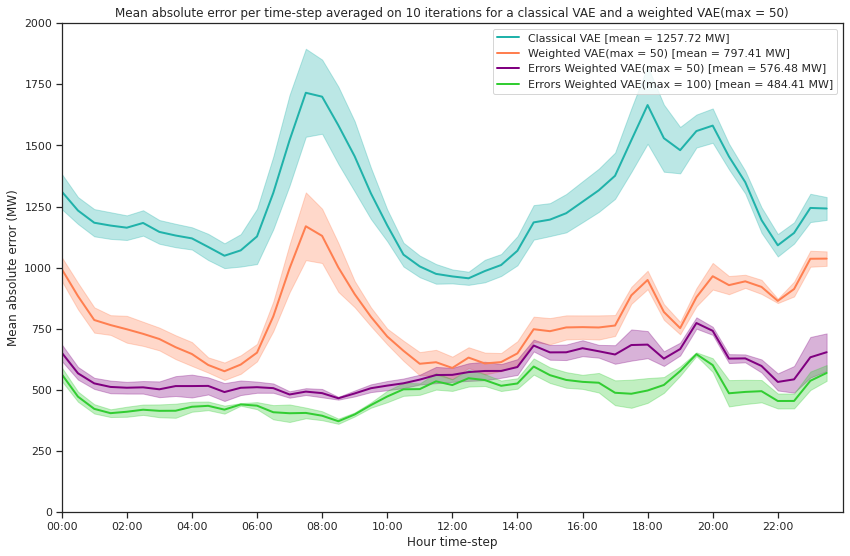

In [100]:
n_iterations = np.array(dict_metrics['CVAEpond 1']['MAE']).shape[0]

mean_classique = np.array(dict_metrics['CVAEpond 1']['MAE']).mean(axis=0)
ci_classique = 1.96 * np.array(dict_metrics['CVAEpond 1']['MAE']).std(axis=0)/np.sqrt(n_iterations)
mean_pond = np.array(dict_metrics['CVAEpond 50']['MAE']).mean(axis=0)
ci_pond = 1.96 * np.array(dict_metrics['CVAEpond 50']['MAE']).std(axis=0)/np.sqrt(n_iterations)
mean_pond_errors = np.array(dict_metrics_errors['CVAEpond 50']['MAE']).mean(axis=0)
ci_pond_errors = 1.96 * np.array(dict_metrics_errors['CVAEpond 50']['MAE']).std(axis=0)/np.sqrt(n_iterations)
mean_pond_errors2 = np.array(dict_metrics_errors['CVAEpond 100']['MAE']).mean(axis=0)
ci_pond_errors2 = 1.96 * np.array(dict_metrics_errors['CVAEpond 100']['MAE']).std(axis=0)/np.sqrt(n_iterations)

fig, ax = plt.subplots(figsize=(14,9))
ax.plot(np.arange(mean_classique.shape[0]), mean_classique, label=f'Classical VAE [mean = {round(np.mean(mean_classique),2)} MW]', color='lightseagreen', linewidth=2)
ax.fill_between(np.arange(mean_classique.shape[0]), (mean_classique-ci_classique), (mean_classique+ci_classique), color='lightseagreen', alpha=.3, linewidth=1)
ax.plot(np.arange(mean_pond.shape[0]), mean_pond, label=f'Weighted VAE(max = 50) [mean = {round(np.mean(mean_pond),2)} MW]', color='coral', linewidth=2)
ax.fill_between(np.arange(mean_pond.shape[0]), (mean_pond-ci_pond), (mean_pond+ci_pond), color='coral', alpha=.3, linewidth=1)
ax.plot(np.arange(mean_pond_errors.shape[0]), mean_pond_errors, label=f'Errors Weighted VAE(max = 50) [mean = {round(np.mean(mean_pond_errors),2)} MW]', color='purple', linewidth=2)
ax.fill_between(np.arange(mean_pond_errors.shape[0]), (mean_pond_errors-ci_pond_errors), (mean_pond_errors+ci_pond_errors), color='purple', alpha=.3, linewidth=1)
ax.plot(np.arange(mean_pond_errors2.shape[0]), mean_pond_errors2, label=f'Errors Weighted VAE(max = 100) [mean = {round(np.mean(mean_pond_errors2),2)} MW]', color='limegreen', linewidth=2)
ax.fill_between(np.arange(mean_pond_errors2.shape[0]), (mean_pond_errors2-ci_pond_errors2), (mean_pond_errors2+ci_pond_errors2), color='limegreen', alpha=.3, linewidth=1)
plt.legend()
plt.xlabel('Hour time-step')
plt.ylabel('Mean absolute error (MW)')
plt.title('Mean absolute error per time-step averaged on 10 iterations for a classical VAE and a weighted VAE(max = 50)')
plt.ylim((0,2000))
index = pd.date_range("00:00", "23:30", freq="30min").strftime('%H:%M').to_list()
ax.set_xlim((0,48))
ax.set_xticks(np.arange(48), index)
ax.locator_params(axis="x", nbins=12)
plt.show()

In [ ]:
dict_metrics_errors

{'CVAEpond 50': {'MAE': [array([536.64109589, 436.25191567, 410.23112158, 353.94726027,
          366.09343964, 390.38930865, 367.59803617, 382.59902611,
          392.66079302, 403.60273973, 388.39804152, 423.03512949,
          435.82419199, 393.81776541, 361.24441353, 390.17878318,
          394.56297089, 403.03988656, 413.97768622, 477.98546661,
          487.98578767, 523.71450128, 527.94053938, 556.89733519,
          546.64674658, 562.71362372, 544.54621147, 567.72380137,
          548.50934289, 617.24148116, 613.96833262, 615.65547945,
          611.74471318, 602.51518622, 555.15968536, 558.30448416,
          580.90615368, 535.70410959, 565.47369435, 672.03463185,
          642.91031678, 558.92555651, 547.51218964, 490.17212115,
          418.86894264, 413.17306293, 483.85639983, 529.25176584]),
   array([523.29959332, 453.9036494 , 410.30940711, 422.98939426,
          431.18318707, 443.83166738, 435.86759953, 483.27904538,
          500.35020334, 482.39351455, 493.95078125, 

In [95]:
df_errors = create_metric_table(dict_metrics_errors)

In [96]:
df_errors

{'MAE': {'mean': [576.4777945294663, 484.40978216859304],
  'std': [85.37373729883231, 73.04856916094901]},
 'MIG': {'mean': [0.18993871202761498, 0.1510734491615553],
  'std': [0.07008529418285459, 0.052175365534274876]},
 'Modularity': {'mean': [0.8019339354811578, 0.8179866889386547],
  'std': [0.02652388640180775, 0.015134027127329697]},
 'Disentanglement': {'mean': [0.09743635069149345, 0.09414176936729152],
  'std': [0.03856797744422482, 0.010593353274023163]},
 'M score': {'mean': [0.4660745126200204, 0.4638843574593987],
  'std': [0.014480007001613617, 0.011937341840782077]},
 'W score': {'mean': [0.9334790529535228, 0.9242090315450309],
  'std': [0.008131438850471441, 0.010310354112473783]},
 'is_W score': {'mean': [0.554758033620016, 0.580861165927835],
  'std': [0.028880096936565642, 0.019088508246007902]},
 'H score': {'mean': [0.21451249685670293, 0.12448612963651547],
  'std': [0.12890348896599235, 0.052815770651823496]},
 'T score': {'mean': [0.9500554091188205, 0.954145

In [113]:
# Récupération EAVAE

cvae_test = models_errors['CVAEpond 50'][0]
x_encoded_error = cvae_test.encoder.predict(input_cvae)[0]

### Réduction supplémentaire de l'erreur via l'utilisation d'un second encodeur

In [131]:
dec_inputs = Input(shape=(new_cae.VAE_params.model_params.latent_dims,), name="dec_input_"+name_model)
x = dec_inputs
for idx, layer_dim in enumerate(new_cae.VAE_params.model_params.decoder_dims):
    if (idx<len(new_cae.VAE_params.model_params.decoder_dims)-1):
        x = Dense(units=layer_dim, activation='relu',
                    name="2nd_decoder_dense_{}".format(idx),
                    kernel_initializer=new_cae.VAE_params.model_params.kernel_initializer,
                    bias_initializer = new_cae.VAE_params.model_params.bias_initializer)(x)
    else: 
        x = Dense(units=layer_dim, activation='linear',
                    name="2nd_decoder_dense_{}".format(idx),
                    kernel_initializer=new_cae.VAE_params.model_params.kernel_initializer,
                    bias_initializer = new_cae.VAE_params.model_params.bias_initializer)(x)
    
boosted_decoder = Model(inputs=dec_inputs, outputs=x, name=name_model+'2nd_dec')

In [132]:
from tensorflow.keras import losses

ponderation = (mean_pond-mean_pond.min())/(mean_pond.max()-mean_pond.min())*(50-1) + 1

def loss_boosting(y_true, y_pred, ponderation=ponderation):
    return tf.math.reduce_sum(tf.math.square(y_true - y_pred) * ponderation, axis=-1)

optimizer = new_cae.VAE_params.training_params.optimizer(10*new_cae.VAE_params.training_params.lr)

boosted_decoder.compile(loss=loss_boosting,
                           loss_weights=1,
                           optimizer=optimizer, experimental_run_tf_function=False)

In [133]:
earl_stop = EarlyStopping(
    monitor='val_loss', min_delta=0, patience=100, verbose=0, mode='auto',
    baseline=None, restore_best_weights=True
)

training_history = boosted_decoder.fit(x_encoded_error, output_cvae, epochs= 4000, verbose=1,
        batch_size=batch_size, callbacks=[earl_stop], validation_split = 0.1)

Epoch 1/4000
144/144 [==============================] - 1s 2ms/step - loss: 927.1284 - val_loss: 631.7850
Epoch 2/4000
144/144 [==============================] - 0s 2ms/step - loss: 800.2238 - val_loss: 441.9266
Epoch 3/4000
144/144 [==============================] - 0s 2ms/step - loss: 630.3074 - val_loss: 256.1453
Epoch 4/4000
144/144 [==============================] - 0s 2ms/step - loss: 442.6325 - val_loss: 142.2017
Epoch 5/4000
144/144 [==============================] - 0s 2ms/step - loss: 290.4322 - val_loss: 91.0074
Epoch 6/4000
144/144 [==============================] - 0s 2ms/step - loss: 190.0036 - val_loss: 65.6727
Epoch 7/4000
144/144 [==============================] - 0s 2ms/step - loss: 129.6598 - val_loss: 50.0628
Epoch 8/4000
144/144 [==============================] - 0s 2ms/step - loss: 93.1376 - val_loss: 39.6560
Epoch 9/4000
144/144 [==============================] - 0s 2ms/step - loss: 70.2595 - val_loss: 31.5495
Epoch 10/4000
144/144 [==============================

In [134]:
test_input_cvae = [df_conso.values[test_set,:]]
x_encoded_test = cvae_test.encoder.predict(test_input_cvae)[0]
x_hat = boosted_decoder.predict(x_encoded_test)

print(f"reconstruction error to scale : {np.mean(np.abs(conso_scaler.inverse_transform(x_hat).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019]))}")

reconstruction error to scale : 397.98403576715896


In [141]:
# Comparaison avec un decoder minimisant une MSE classique

dec_inputs = Input(shape=(new_cae.VAE_params.model_params.latent_dims,), name="dec_input_"+name_model)
x = dec_inputs
for idx, layer_dim in enumerate(new_cae.VAE_params.model_params.decoder_dims):
    if (idx<len(new_cae.VAE_params.model_params.decoder_dims)-1):
        x = Dense(units=layer_dim, activation='relu',
                    name="2nd_decoder_dense_{}".format(idx),
                    kernel_initializer=new_cae.VAE_params.model_params.kernel_initializer,
                    bias_initializer = new_cae.VAE_params.model_params.bias_initializer)(x)
    else: 
        x = Dense(units=layer_dim, activation='linear',
                    name="2nd_decoder_dense_{}".format(idx),
                    kernel_initializer=new_cae.VAE_params.model_params.kernel_initializer,
                    bias_initializer = new_cae.VAE_params.model_params.bias_initializer)(x)
    
classical_decoder = Model(inputs=dec_inputs, outputs=x, name=name_model+'2nd_dec')

In [142]:
from tensorflow.keras import losses

optimizer = new_cae.VAE_params.training_params.optimizer(10*new_cae.VAE_params.training_params.lr)

classical_decoder.compile(loss=MeanSquaredError(reduction=tf.keras.losses.Reduction.SUM),
                           loss_weights=1,
                           optimizer=optimizer, experimental_run_tf_function=False)

In [143]:
earl_stop = EarlyStopping(
    monitor='val_loss', min_delta=0, patience=100, verbose=0, mode='auto',
    baseline=None, restore_best_weights=True
)

training_history = classical_decoder.fit(x_encoded_error, output_cvae, epochs= 4000, verbose=1,
        batch_size=batch_size, callbacks=[earl_stop], validation_split = 0.1)

Epoch 1/4000
144/144 [==============================] - 1s 2ms/step - loss: 16.7433 - val_loss: 12.8419
Epoch 2/4000
144/144 [==============================] - 0s 2ms/step - loss: 14.1565 - val_loss: 10.1122
Epoch 3/4000
144/144 [==============================] - 0s 2ms/step - loss: 9.9992 - val_loss: 5.6113
Epoch 4/4000
144/144 [==============================] - 0s 2ms/step - loss: 5.3813 - val_loss: 2.4648
Epoch 5/4000
144/144 [==============================] - 0s 2ms/step - loss: 2.7129 - val_loss: 1.3404
Epoch 6/4000
144/144 [==============================] - 0s 2ms/step - loss: 1.5826 - val_loss: 0.9109
Epoch 7/4000
144/144 [==============================] - 0s 2ms/step - loss: 1.0866 - val_loss: 0.7111
Epoch 8/4000
144/144 [==============================] - 0s 2ms/step - loss: 0.8345 - val_loss: 0.5704
Epoch 9/4000
144/144 [==============================] - 0s 2ms/step - loss: 0.6855 - val_loss: 0.4797
Epoch 10/4000
144/144 [==============================] - 0s 2ms/step - loss: 0

In [144]:
x_hat2 = classical_decoder.predict(x_encoded_test)

print(f"reconstruction error to scale : {np.mean(np.abs(conso_scaler.inverse_transform(x_hat2).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019]))}")

reconstruction error to scale : 407.101030072774


In [145]:
# Comparaison avec un decoder minimisant une MSE pondérée uniformément

dec_inputs = Input(shape=(new_cae.VAE_params.model_params.latent_dims,), name="dec_input_"+name_model)
x = dec_inputs
for idx, layer_dim in enumerate(new_cae.VAE_params.model_params.decoder_dims):
    if (idx<len(new_cae.VAE_params.model_params.decoder_dims)-1):
        x = Dense(units=layer_dim, activation='relu',
                    name="2nd_decoder_dense_{}".format(idx),
                    kernel_initializer=new_cae.VAE_params.model_params.kernel_initializer,
                    bias_initializer = new_cae.VAE_params.model_params.bias_initializer)(x)
    else: 
        x = Dense(units=layer_dim, activation='linear',
                    name="2nd_decoder_dense_{}".format(idx),
                    kernel_initializer=new_cae.VAE_params.model_params.kernel_initializer,
                    bias_initializer = new_cae.VAE_params.model_params.bias_initializer)(x)
    
uniform_decoder = Model(inputs=dec_inputs, outputs=x, name=name_model+'2nd_dec')

In [146]:
from tensorflow.keras import losses

optimizer = new_cae.VAE_params.training_params.optimizer(10*new_cae.VAE_params.training_params.lr)

uniform_decoder.compile(loss=MeanSquaredError(reduction=tf.keras.losses.Reduction.SUM),
                           loss_weights=mean_pond.mean(),
                           optimizer=optimizer, experimental_run_tf_function=False)

In [147]:
earl_stop = EarlyStopping(
    monitor='val_loss', min_delta=0, patience=100, verbose=0, mode='auto',
    baseline=None, restore_best_weights=True
)

training_history = uniform_decoder.fit(x_encoded_error, output_cvae, epochs= 4000, verbose=1,
        batch_size=batch_size, callbacks=[earl_stop], validation_split = 0.1)

Epoch 1/4000
144/144 [==============================] - 1s 2ms/step - loss: 10927.5391 - val_loss: 8678.4971
Epoch 2/4000
144/144 [==============================] - 0s 2ms/step - loss: 9397.7783 - val_loss: 7526.4541
Epoch 3/4000
144/144 [==============================] - 0s 2ms/step - loss: 6838.5513 - val_loss: 5658.4614
Epoch 4/4000
144/144 [==============================] - 0s 1ms/step - loss: 4073.7219 - val_loss: 3459.4641
Epoch 5/4000
144/144 [==============================] - 0s 2ms/step - loss: 2072.0740 - val_loss: 1689.5920
Epoch 6/4000
144/144 [==============================] - 0s 2ms/step - loss: 1067.3683 - val_loss: 909.1194
Epoch 7/4000
144/144 [==============================] - 0s 2ms/step - loss: 713.0230 - val_loss: 618.3719
Epoch 8/4000
144/144 [==============================] - 0s 2ms/step - loss: 575.4418 - val_loss: 485.8321
Epoch 9/4000
144/144 [==============================] - 0s 2ms/step - loss: 498.0412 - val_loss: 408.3318
Epoch 10/4000
144/144 [===========

In [148]:
x_hat3 = uniform_decoder.predict(x_encoded_test)

print(f"reconstruction error to scale : {np.mean(np.abs(conso_scaler.inverse_transform(x_hat3).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019]))}")

reconstruction error to scale : 399.26045824860876


### Test du Mode-Boosted-VAE

Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  False
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003
Model: "cvae"
_____________________________________________________________________________________________

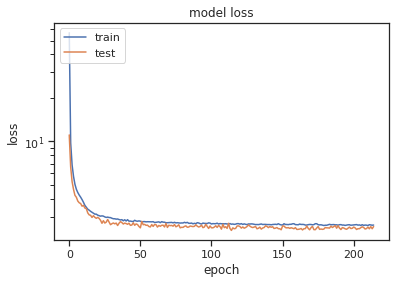

## MODEL SAVED ##


In [120]:
#TODO: Apprendre un Mode-VAE témoin pour comparer avec celui pondéré par les erreurs
ponderation = (sample_weight-sample_weight.min())/(sample_weight.max()-sample_weight.min())*(50-1) + 1

loss_weights = {"kl_loss" : 0.3,
                "info_loss" : 66,
                "recon_loss": ponderation.mean()}

vae_params = VAE_params(name=name_model, out_dir = log_dir_model)
vae_params.set_model_params()
vae_params.set_training_params()
vae_params.model_params.encoder_dims = e_dims
vae_params.model_params.decoder_dims = d_dims
vae_params.model_params.latent_dims = 4
vae_params.model_params.cond_dims = []
vae_params.model_params.emb_dims = []
vae_params.model_params.with_embedding = False
vae_params.model_params.with_Time2Vec = False
vae_params.model_params.nb_encoder_ensemble = 3

vae_loss = VAELoss(loss_weights = loss_weights, custom_loss=None)
vae_loss.options["log_prior_sigma"] = [-2.,-1.,0.,1.]

vae_params.training_params.loss = vae_loss
vae_params.training_params.lr = 3e-4

mode_cvae_temoin = CVAE(vae_params)
mode_cvae_temoin.build_model(vae_params)
earl_stop = EarlyStopping(
    monitor='val_loss', min_delta=0, patience=100, verbose=0, mode='auto',
    baseline=None, restore_best_weights=True) 

mode_cvae_temoin.train(input_cvae, output_cvae, epochs= 4000, verbose=1,
                      batch_size=batch_size, callbacks=[earl_stop])

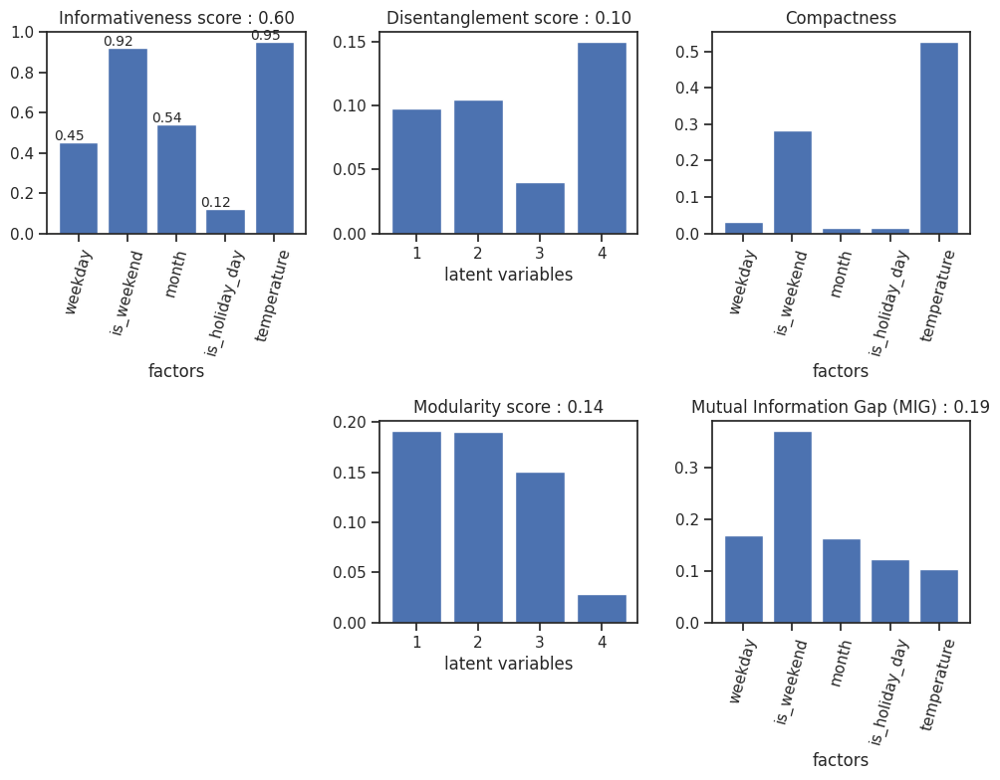

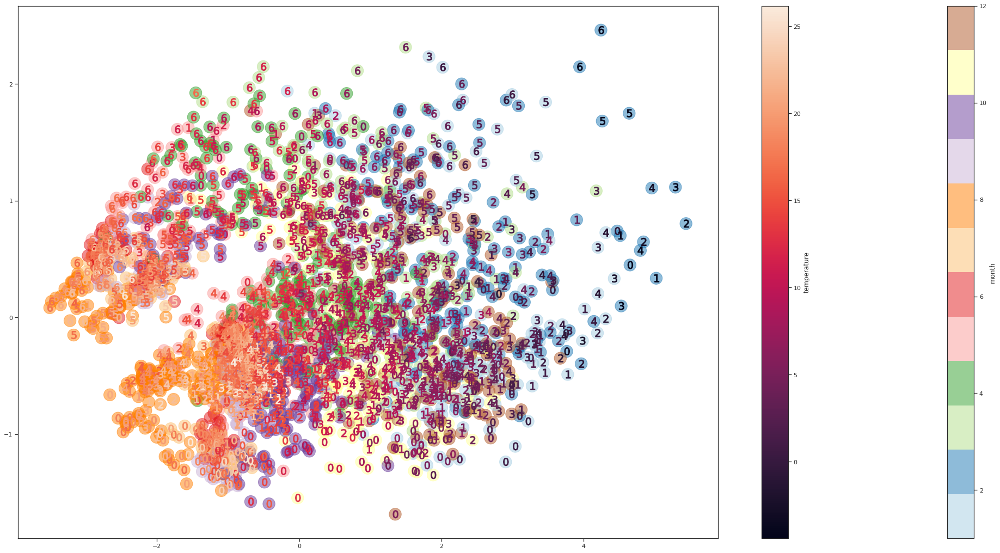

In [121]:
# Model evaluation
x_encoded_mode_temoin = mode_cvae_temoin.encoder.predict(input_cvae)[0] 
model_eval, _ = evaluate_latent_code(x_encoded_mode_temoin, factorMatrix[train_set,:], factorDesc, orthogonalize=True, normalize_information=True)
display_evaluation_latent_code(model_eval, 4, factorDesc)
prez_2D(x_encoded_mode_temoin, factorMatrix[train_set,:], temperatureMean[train_set,:])

# Save MAE loss per time step to test the robustness of errors. 
# Only the mean of this profile will be kept in the table
test_input_cvae = [df_conso.values[test_set,:]]
x_hat_mode_temoin = mode_cvae_temoin.model.predict(test_input_cvae)
mae_mode_temoin = np.mean(np.abs(conso_scaler.inverse_transform(x_hat_mode_temoin) - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019].reshape(365,48)),axis=0)


In [122]:
mae_mode_temoin.mean()

728.2387250508349

Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  False
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003
Model: "cvae"
_____________________________________________________________________________________________

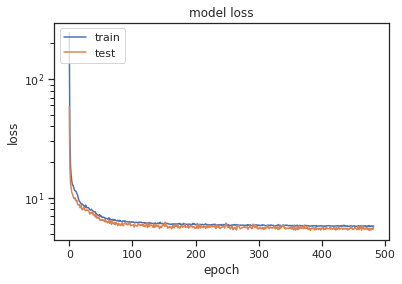

## MODEL SAVED ##


In [112]:
ponderation = (sample_weight-sample_weight.min())/(sample_weight.max()-sample_weight.min())*(50-1) + 1
def loss(y_true, y_pred, ponderation=ponderation):
    return tf.math.reduce_sum(tf.math.square(y_true - y_pred) * ponderation, axis=-1)

custom_loss={"pond_loss" : {"function" : loss,
            "args" :{} }}

loss_weights = {"kl_loss" : 0.3,
                "info_loss" : 66,
                "pond_loss": 1}

vae_params = VAE_params(name=name_model, out_dir = log_dir_model)
vae_params.set_model_params()
vae_params.set_training_params()
vae_params.model_params.encoder_dims = e_dims
vae_params.model_params.decoder_dims = d_dims
vae_params.model_params.latent_dims = 4
vae_params.model_params.cond_dims = []
vae_params.model_params.emb_dims = []
vae_params.model_params.with_embedding = False
vae_params.model_params.with_Time2Vec = False
vae_params.model_params.nb_encoder_ensemble = 3

vae_loss = VAELoss(loss_weights = loss_weights, custom_loss=custom_loss)
vae_loss.options["log_prior_sigma"] = [-2.,-1.,0.,1.]

vae_params.training_params.loss = vae_loss
vae_params.training_params.lr = 3e-4

mode_cvae = CVAEpond(vae_params)
mode_cvae.build_model(vae_params)
earl_stop = EarlyStopping(
    monitor='val_loss', min_delta=0, patience=100, verbose=0, mode='auto',
    baseline=None, restore_best_weights=True) 

mode_cvae.train(input_cvae, output_cvae, epochs= 4000, verbose=0,
                      batch_size=batch_size, callbacks=[earl_stop])

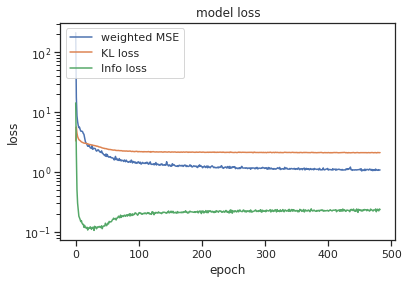

In [113]:
plt.plot(mode_cvae.training_history.history['pond_loss'])
plt.plot(mode_cvae.training_history.history['kl_loss'])
plt.plot(mode_cvae.training_history.history['info_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.yscale('log')
plt.legend(['weighted MSE', 'KL loss', 'Info loss'], loc='upper left')
plt.show()

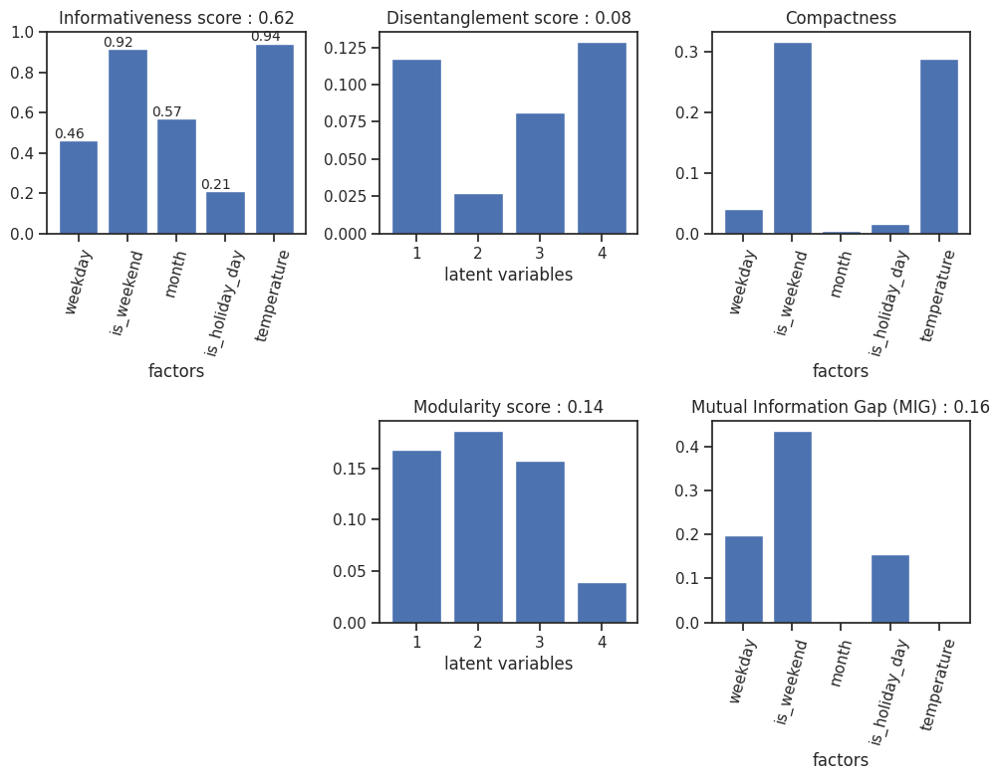

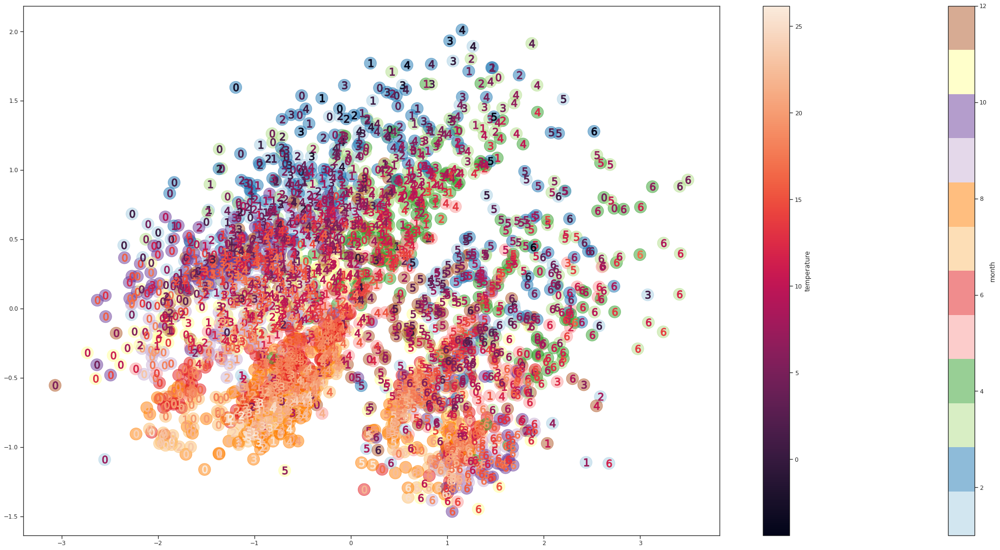

In [114]:
# Model evaluation
x_encoded_mode = mode_cvae.encoder.predict(input_cvae)[0] 
model_eval, _ = evaluate_latent_code(x_encoded_mode, factorMatrix[train_set,:], factorDesc, orthogonalize=True, normalize_information=True)
display_evaluation_latent_code(model_eval, 4, factorDesc)
prez_2D(x_encoded_mode, factorMatrix[train_set,:], temperatureMean[train_set,:])

# Save MAE loss per time step to test the robustness of errors. 
# Only the mean of this profile will be kept in the table
test_input_cvae = [df_conso.values[test_set,:]]
x_hat_mode = mode_cvae.model.predict(test_input_cvae)
mae_mode = np.mean(np.abs(conso_scaler.inverse_transform(x_hat_mode) - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019].reshape(365,48)),axis=0)


In [115]:
mae_mode.mean()

612.3239179776683